In [31]:
import pandas as pd

Firm_List = pd.read_parquet(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\rcid_exposure_with_firm_info.parquet")
Firm_List

,rcid,genai_rcid_total,genai_rcid_core,total_positions,ticker,company,gvkey,naics_code,top_core_positions,top_total_positions
0,19349298.0,0.450000,0.300000,2,None,Thirdline AB,<NA>,None,2.0,2.0
1,23700144.0,0.047619,0.047619,1,None,BULLARD ELECTRIC,<NA>,None,0.0,0.0
2,7934402.0,0.187059,0.137647,2,None,U-Like Fabrics,<NA>,None,1.0,1.0
3,16836328.0,0.000000,0.000000,1,None,Poirier Web Solutions,<NA>,None,0.0,0.0
4,22912940.0,0.271398,0.183413,3,None,CISSY CLARK & COMPANY,<NA>,None,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
15446027,12523574.0,0.250000,0.150000,1,None,None,<NA>,None,0.0,0.0
15446028,19573014.0,0.000000,0.000000,2,None,None,<NA>,None,0.0,0.0
15446029,20403850.0,0.251225,0.159314,2,None,None,<NA>,None,1.0,1.0
15446030,93137042.0,0.308193,0.245636,26,None,None,<NA>,None,14.0,14.0


In [32]:
# Keep only public firms where gvkey is not null
Public_Firm = Firm_List[Firm_List["gvkey"].notna()].copy()
Public_Firm

,rcid,genai_rcid_total,genai_rcid_core,total_positions,ticker,company,gvkey,naics_code,top_core_positions,top_total_positions
127,20916803.0,0.016667,0.016667,2,None,"Hutech norin Co., Ltd.",206423,484110,0.0,0.0
131,8226736.0,0.339867,0.264761,233,None,Shimao Ltd.,278283,523910,166.0,166.0
197,22143961.0,0.468866,0.397338,3,None,USWeb Corp.,65988,518210,2.0,2.0
1289,264926.0,0.329722,0.271605,116,2158,"Yidu Tech, Inc.",346163,541519,79.0,80.0
1363,1300095.0,0.284580,0.230113,2112,GMED,"Globus Medical, Inc.",171002,334510,1057.0,1067.0
...,...,...,...,...,...,...,...,...,...,...
15438038,266860.0,0.343333,0.234786,44,None,Norwegian Property ASA,278135,531120,23.0,30.0
15438078,254226.0,0.395182,0.265828,8,None,Watermark Funds Management Pty Ltd.,323077,523940,7.0,7.0
15438198,22151648.0,0.320453,0.234988,17,5233,Taiheiyo Cement Corp.,20161,327310,10.0,10.0
15438207,280479.0,0.283199,0.223490,123,SCHD,Scheerders van Kerchove's Verenigde Fabrieken NV,220276,332323,65.0,67.0


In [3]:
Public_Firm.to_parquet(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Public_Firm.parquet", index=False)

In [ ]:
Firm_Universe = pd.read_parquet(r"I:\revelio_raw_2026\revelio_company_ref.parquet")
Firm_Universe

In [3]:
import pandas as pd
Public_Firm = pd.read_parquet(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Public_Firm_updated.parquet")
Public_Firm

,rcid,genai_rcid_total,genai_rcid_core,total_positions,ticker,company,gvkey,top_core_positions,top_total_positions,naics_code,hq_country
0,557687.0,0.457534,0.326423,2,APTY,"APT Systems, Inc.",19093,2.0,2.0,518210,United States
1,572005.0,0.361451,0.285361,176,CHELLARAM,Chellarams Plc,286355,122.0,126.0,325998,Nigeria
2,573517.0,0.371970,0.285670,912,None,"TI Gotham, Inc.",19580,602.0,605.0,513120,United States
3,577576.0,0.334520,0.243995,205,JDWS,JDW Sugar Mills Ltd.,270843,107.0,119.0,311314,Pakistan
4,592180.0,0.340438,0.261169,1491,None,"RS&H, Inc.",25722,1063.0,1161.0,541310,United States
...,...,...,...,...,...,...,...,...,...,...,...
51165,25177818.0,0.135417,0.104167,2,None,（株）ケアネット,284405,0.0,0.0,None,None
51166,4152260.0,0.256355,0.204603,19,None,IFTE,231828,9.0,9.0,None,None
51167,9106141.0,0.343862,0.253136,2,None,ASTMAX Co Ltd,278181,1.0,1.0,None,None
51168,92843875.0,0.209195,0.150000,2,None,VRWay Communication SA,312841,1.0,1.0,None,None


In [7]:
#Use DuckDB to merge Public_Firm with Firm_Universe to overwrite nacis_code and add hq_country, then save the updated Public_Firm as a new parquet file

import duckdb

# =========================================================
# Paths
# =========================================================
public_firm_path = r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Public_Firm.parquet"
company_ref_path = r"I:\revelio_raw_2026\revelio_company_ref.parquet"
output_path = r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Public_Firm_updated.parquet"

# Escape single quotes for SQL strings
public_firm_path_sql = public_firm_path.replace("'", "''")
company_ref_path_sql = company_ref_path.replace("'", "''")
output_path_sql = output_path.replace("'", "''")

con = duckdb.connect()

con.execute(f"""
COPY (
    WITH company_ref_dedup AS (
        SELECT rcid, naics_code, hq_country
        FROM (
            SELECT
                rcid,
                naics_code,
                hq_country,
                ROW_NUMBER() OVER (PARTITION BY rcid ORDER BY rcid) AS rn
            FROM read_parquet('{company_ref_path_sql}')
        )
        WHERE rn = 1
    )
    SELECT
        pf.* EXCLUDE (naics_code),
        COALESCE(cr.naics_code, pf.naics_code) AS naics_code,
        cr.hq_country
    FROM read_parquet('{public_firm_path_sql}') AS pf
    LEFT JOIN company_ref_dedup AS cr
    ON pf.rcid = cr.rcid
) TO '{output_path_sql}' (FORMAT PARQUET);
""")

print("Done. File saved to:")
print(output_path)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done. File saved to:
E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Public_Firm_updated.parquet


In [8]:
Public_Firm = pd.read_parquet(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Public_Firm_updated.parquet")
Public_Firm

,rcid,genai_rcid_total,genai_rcid_core,total_positions,ticker,company,gvkey,top_core_positions,top_total_positions,naics_code,hq_country
0,557687.0,0.457534,0.326423,2,APTY,"APT Systems, Inc.",19093,2.0,2.0,518210,United States
1,572005.0,0.361451,0.285361,176,CHELLARAM,Chellarams Plc,286355,122.0,126.0,325998,Nigeria
2,573517.0,0.371970,0.285670,912,None,"TI Gotham, Inc.",19580,602.0,605.0,513120,United States
3,577576.0,0.334520,0.243995,205,JDWS,JDW Sugar Mills Ltd.,270843,107.0,119.0,311314,Pakistan
4,592180.0,0.340438,0.261169,1491,None,"RS&H, Inc.",25722,1063.0,1161.0,541310,United States
...,...,...,...,...,...,...,...,...,...,...,...
51165,25177818.0,0.135417,0.104167,2,None,（株）ケアネット,284405,0.0,0.0,None,None
51166,4152260.0,0.256355,0.204603,19,None,IFTE,231828,9.0,9.0,None,None
51167,9106141.0,0.343862,0.253136,2,None,ASTMAX Co Ltd,278181,1.0,1.0,None,None
51168,92843875.0,0.209195,0.150000,2,None,VRWay Communication SA,312841,1.0,1.0,None,None


In [4]:
Public_Firm = Public_Firm[Public_Firm['hq_country'] == 'United States']
Public_Firm

,rcid,genai_rcid_total,genai_rcid_core,total_positions,ticker,company,gvkey,top_core_positions,top_total_positions,naics_code,hq_country
0,557687.0,0.457534,0.326423,2,APTY,"APT Systems, Inc.",19093,2.0,2.0,518210,United States
2,573517.0,0.371970,0.285670,912,None,"TI Gotham, Inc.",19580,602.0,605.0,513120,United States
4,592180.0,0.340438,0.261169,1491,None,"RS&H, Inc.",25722,1063.0,1161.0,541310,United States
7,603989.0,0.369328,0.289091,24,None,"Hospitality International, Inc.",5719,16.0,18.0,721110,United States
15,639453.0,0.255246,0.205630,16,ZAZA,ZaZa Energy Corp.,170773,8.0,7.0,211120,United States
...,...,...,...,...,...,...,...,...,...,...,...
50818,21019759.0,0.345718,0.288915,96,None,Innocoll Holdings Plc,20951,59.0,59.0,325412,United States
50820,22142764.0,0.262057,0.187346,5109,USM,United States Cellular Corp.,14369,2143.0,2225.0,517112,United States
50822,22150389.0,0.401881,0.293545,55,IPDN,"Professional Diversity Network, Inc.",8661,38.0,39.0,513140,United States
50856,22215299.0,0.043478,0.043478,1,None,National Commerce Corp. (Alabama),23294,0.0,0.0,522110,United States


In [33]:
import pandas as pd
import numpy as np

# Make sure naics_code is string-like
Public_Firm["naics2"] = (
    Public_Firm["naics_code"]
    .astype("string")
    .str.extract(r"^(\d{2})", expand=False)
)

# Map 2-digit NAICS to industry
naics2_to_industry = {
    "11": "Agriculture, Forestry, Fishing and Hunting",
    "21": "Mining, Quarrying, and Oil and Gas Extraction",
    "22": "Utilities",
    "23": "Construction",
    "31": "Manufacturing",
    "32": "Manufacturing",
    "33": "Manufacturing",
    "42": "Wholesale Trade",
    "44": "Retail Trade",
    "45": "Retail Trade",
    "48": "Transportation and Warehousing",
    "49": "Transportation and Warehousing",
    "51": "Information",
    "52": "Finance and Insurance",
    "53": "Real Estate and Rental and Leasing",
    "54": "Professional, Scientific, and Technical Services",
    "55": "Management of Companies and Enterprises",
    "56": "Administrative and Support and Waste Management and Remediation Services",
    "61": "Educational Services",
    "62": "Health Care and Social Assistance",
    "71": "Arts, Entertainment, and Recreation",
    "72": "Accommodation and Food Services",
    "81": "Other Services (except Public Administration)",
    "92": "Public Administration",
}

Public_Firm["industry"] = Public_Firm["naics2"].map(naics2_to_industry)
Public_Firm["industry"] = Public_Firm["industry"].fillna("Unknown")

Public_Firm

,rcid,genai_rcid_total,genai_rcid_core,total_positions,ticker,company,gvkey,naics_code,top_core_positions,top_total_positions,naics2,industry
127,20916803.0,0.016667,0.016667,2,None,"Hutech norin Co., Ltd.",206423,484110,0.0,0.0,48,Transportation and Warehousing
131,8226736.0,0.339867,0.264761,233,None,Shimao Ltd.,278283,523910,166.0,166.0,52,Finance and Insurance
197,22143961.0,0.468866,0.397338,3,None,USWeb Corp.,65988,518210,2.0,2.0,51,Information
1289,264926.0,0.329722,0.271605,116,2158,"Yidu Tech, Inc.",346163,541519,79.0,80.0,54,"Professional, Scientific, and Technical Services"
1363,1300095.0,0.284580,0.230113,2112,GMED,"Globus Medical, Inc.",171002,334510,1057.0,1067.0,33,Manufacturing
...,...,...,...,...,...,...,...,...,...,...,...,...
15438038,266860.0,0.343333,0.234786,44,None,Norwegian Property ASA,278135,531120,23.0,30.0,53,Real Estate and Rental and Leasing
15438078,254226.0,0.395182,0.265828,8,None,Watermark Funds Management Pty Ltd.,323077,523940,7.0,7.0,52,Finance and Insurance
15438198,22151648.0,0.320453,0.234988,17,5233,Taiheiyo Cement Corp.,20161,327310,10.0,10.0,32,Manufacturing
15438207,280479.0,0.283199,0.223490,123,SCHD,Scheerders van Kerchove's Verenigde Fabrieken NV,220276,332323,65.0,67.0,33,Manufacturing


In [6]:
import pandas as pd

Public_Firm["industry_3code"] = (
    Public_Firm["naics_code"]
    .astype("string")
    .str.extract(r"^(\d{3})", expand=False)
)

C:\Users\82383\AppData\Local\Temp\ipykernel_42192\3472866253.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Public_Firm["industry_3code"] = (


In [7]:
import pandas as pd


# Map 3-digit NAICS to industry names
naics_3_map = {
    "111": "Crop Production",
    "112": "Animal Production and Aquaculture",
    "113": "Forestry and Logging",
    "114": "Fishing, Hunting and Trapping",
    "115": "Agriculture and Forestry Support Activities",
    
    "211": "Oil and Gas Extraction",
    "212": "Mining (except Oil and Gas)",
    "213": "Support Activities for Mining",
    
    "221": "Utilities",
    
    "236": "Construction of Buildings",
    "237": "Heavy and Civil Engineering Construction",
    "238": "Specialty Trade Contractors",
    
    "311": "Food Manufacturing",
    "312": "Beverage and Tobacco Product Manufacturing",
    "313": "Textile Mills",
    "314": "Textile Product Mills",
    "315": "Apparel Manufacturing",
    "316": "Leather and Allied Product Manufacturing",
    "321": "Wood Product Manufacturing",
    "322": "Paper Manufacturing",
    "323": "Printing and Related Support Activities",
    "324": "Petroleum and Coal Products Manufacturing",
    "325": "Chemical Manufacturing",
    "326": "Plastics and Rubber Products Manufacturing",
    "327": "Nonmetallic Mineral Product Manufacturing",
    "331": "Primary Metal Manufacturing",
    "332": "Fabricated Metal Product Manufacturing",
    "333": "Machinery Manufacturing",
    "334": "Computer and Electronic Product Manufacturing",
    "335": "Electrical Equipment, Appliance, and Component Manufacturing",
    "336": "Transportation Equipment Manufacturing",
    "337": "Furniture and Related Product Manufacturing",
    "339": "Miscellaneous Manufacturing",
    
    "423": "Merchant Wholesalers, Durable Goods",
    "424": "Merchant Wholesalers, Nondurable Goods",
    "425": "Wholesale Electronic Markets and Agents and Brokers",
    
    "441": "Motor Vehicle and Parts Dealers",
    "442": "Furniture and Home Furnishings Stores",
    "443": "Electronics and Appliance Stores",
    "444": "Building Material and Garden Equipment Stores",
    "445": "Food and Beverage Stores",
    "446": "Health and Personal Care Stores",
    "447": "Gasoline Stations",
    "448": "Clothing and Clothing Accessories Stores",
    "451": "Sporting Goods, Hobby, Book, and Music Stores",
    "452": "General Merchandise Stores",
    "453": "Miscellaneous Store Retailers",
    "454": "Nonstore Retailers",
    
    "481": "Air Transportation",
    "482": "Rail Transportation",
    "483": "Water Transportation",
    "484": "Truck Transportation",
    "485": "Transit and Ground Passenger Transportation",
    "486": "Pipeline Transportation",
    "487": "Scenic and Sightseeing Transportation",
    "488": "Support Activities for Transportation",
    "491": "Postal Service",
    "492": "Couriers and Messengers",
    "493": "Warehousing and Storage",
    
    "511": "Publishing Industries",
    "512": "Motion Picture and Sound Recording Industries",
    "515": "Broadcasting",
    "517": "Telecommunications",
    "518": "Data Processing, Hosting, and Related Services",
    "519": "Other Information Services",
    
    "521": "Monetary Authorities-Central Bank",
    "522": "Credit Intermediation and Related Activities",
    "523": "Securities, Commodity Contracts, and Other Financial Investments",
    "524": "Insurance Carriers and Related Activities",
    "525": "Funds, Trusts, and Other Financial Vehicles",
    
    "531": "Real Estate",
    "532": "Rental and Leasing Services",
    "533": "Lessors of Nonfinancial Intangible Assets",
    
    "541": "Professional, Scientific, and Technical Services",
    "551": "Management of Companies and Enterprises",
    "561": "Administrative and Support Services",
    "562": "Waste Management and Remediation Services",
    
    "611": "Educational Services",
    "621": "Ambulatory Health Care Services",
    "622": "Hospitals",
    "623": "Nursing and Residential Care Facilities",
    "624": "Social Assistance",
    
    "711": "Performing Arts, Spectator Sports, and Related Industries",
    "712": "Museums, Historical Sites, and Similar Institutions",
    "713": "Amusement, Gambling, and Recreation Industries",
    
    "721": "Accommodation",
    "722": "Food Services and Drinking Places",
    
    "811": "Repair and Maintenance",
    "812": "Personal and Laundry Services",
    "813": "Religious, Grantmaking, Civic, Professional, and Similar Organizations",
    
    "921": "Executive, Legislative, and Other General Government Support",
    "922": "Justice, Public Order, and Safety Activities",
    "923": "Administration of Human Resource Programs",
    "924": "Administration of Environmental Quality Programs",
    "925": "Administration of Housing Programs, Urban Planning, and Community Development",
    "926": "Administration of Economic Programs",
    "927": "Space Research and Technology",
    "928": "National Security and International Affairs",
}

Public_Firm["industry_3digit"] = Public_Firm["industry_3code"].map(naics_3_map).fillna("Unknown")

C:\Users\82383\AppData\Local\Temp\ipykernel_42192\591127040.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Public_Firm["industry_3digit"] = Public_Firm["industry_3code"].map(naics_3_map).fillna("Unknown")


In [8]:
Public_Firm

,rcid,genai_rcid_total,genai_rcid_core,total_positions,ticker,company,gvkey,top_core_positions,top_total_positions,naics_code,hq_country,industry_3code,industry_3digit
0,557687.0,0.457534,0.326423,2,APTY,"APT Systems, Inc.",19093,2.0,2.0,518210,United States,518,"Data Processing, Hosting, and Related Services"
2,573517.0,0.371970,0.285670,912,None,"TI Gotham, Inc.",19580,602.0,605.0,513120,United States,513,Unknown
4,592180.0,0.340438,0.261169,1491,None,"RS&H, Inc.",25722,1063.0,1161.0,541310,United States,541,"Professional, Scientific, and Technical Services"
7,603989.0,0.369328,0.289091,24,None,"Hospitality International, Inc.",5719,16.0,18.0,721110,United States,721,Accommodation
15,639453.0,0.255246,0.205630,16,ZAZA,ZaZa Energy Corp.,170773,8.0,7.0,211120,United States,211,Oil and Gas Extraction
...,...,...,...,...,...,...,...,...,...,...,...,...,...
50818,21019759.0,0.345718,0.288915,96,None,Innocoll Holdings Plc,20951,59.0,59.0,325412,United States,325,Chemical Manufacturing
50820,22142764.0,0.262057,0.187346,5109,USM,United States Cellular Corp.,14369,2143.0,2225.0,517112,United States,517,Telecommunications
50822,22150389.0,0.401881,0.293545,55,IPDN,"Professional Diversity Network, Inc.",8661,38.0,39.0,513140,United States,513,Unknown
50856,22215299.0,0.043478,0.043478,1,None,National Commerce Corp. (Alabama),23294,0.0,0.0,522110,United States,522,Credit Intermediation and Related Activities


**Merge with Compustat**

In [48]:
Compustat_2022 = pd.read_parquet(r"C:\Users\82383\UF Dropbox\Wang Boyu\AI Financing\Data\Compustat Fundamental Annual\funda-2022.parquet")
Compustat_2022

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,prcc_f,prch_f,prcl_f,adjex_f,rank,au,auop,auopic,ceoso,cfoso
0,001004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,50.11,56.86,33.75,1.0,1,6,1,1,Y,Y
1,001004,2023-05-31,2022,INDL,C,D,SUMM_STD,AIR,000361105,AAR CORP,...,50.11,56.86,33.75,1.0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
2,001045,2022-12-31,2022,INDL,C,D,STD,AAL,02376R102,AMERICAN AIRLINES GROUP INC,...,12.72,21.42,11.6514,1.0,1,6,1,1,Y,Y
3,001045,2022-12-31,2022,INDL,C,D,SUMM_STD,AAL,02376R102,AMERICAN AIRLINES GROUP INC,...,12.72,21.42,11.6514,1.0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
4,001050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,11.68,12.89,4.09,1.0,1,11,1,1,Y,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20795,356687,2022-12-31,2022,INDL,C,D,SUMM_STD,SASKF,046824108,ATHA ENERGY CORP,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
20796,356927,2022-07-31,2022,INDL,C,D,STD,CYBHF,23250C201,CYBERCATCH HOLDINGS INC,...,0.616,0.6952,0.2992,0.1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
20797,356927,2022-07-31,2022,INDL,C,D,SUMM_STD,CYBHF,23250C201,CYBERCATCH HOLDINGS INC,...,0.616,0.6952,0.2992,0.1,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
20798,366911,2022-12-31,2022,INDL,C,D,STD,AMRZ,H2927K103,AMRIZE LTD,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


**Data Clean**

In [49]:

Compustat_2022 = Compustat_2022[
    (Compustat_2022["indfmt"] == "INDL") &
    (Compustat_2022["consol"] == "C") &
    (Compustat_2022["popsrc"] == "D") &
    (Compustat_2022["datafmt"] == "STD") &
    (Compustat_2022["curcd"] == "USD")
].copy()

Compustat_2022

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,prcc_f,prch_f,prcl_f,adjex_f,rank,au,auop,auopic,ceoso,cfoso
0,001004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,50.11,56.86,33.75,1.0,1,6,1,1,Y,Y
2,001045,2022-12-31,2022,INDL,C,D,STD,AAL,02376R102,AMERICAN AIRLINES GROUP INC,...,12.72,21.42,11.6514,1.0,1,6,1,1,Y,Y
4,001050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,11.68,12.89,4.09,1.0,1,11,1,1,Y,Y
7,001062,2022-11-30,2022,INDL,C,D,STD,ASA,G3156P103,ASA GOLD AND PRECIOUS METALS,...,14.26,23.79,11.93,1.0,1,9,1,0,Y,Y
8,001075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,76.04,80.6,59.03,1.0,1,5,1,1,Y,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20782,353444,2022-12-31,2022,INDL,C,D,STD,HLN,405552100,HALEON PLC,...,8.0,8.5,5.59,<NA>,1,6,1,0,Y,Y
20785,353945,2022-12-31,2022,INDL,C,D,STD,ACLLY,00449R109,ACCELLERON INDUSTRIES AG,...,20.693,20.989,14.4,1.0,1,6,4,0,N,N
20787,355398,2022-12-31,2022,INDL,C,D,STD,HDL,86803S106,SUPER HI INTERNATIONAL HOLDI,...,<NA>,<NA>,<NA>,<NA>,1,5,1,0,E,E
20789,356128,2022-12-31,2022,INDL,C,D,STD,KSPI,48581R205,JOINT STOCK COMPANY KASPI KZ,...,66.0,99.1,43.5,1.0,1,5,4,0,E,E


In [51]:
import pandas as pd

# 1) convert gvkey to numeric in both dataframes
Compustat_2022["gvkey"] = Compustat_2022["gvkey"].astype("Int64")
Public_Firm["gvkey"] = Public_Firm["gvkey"].astype("Int64")


Compustat_2022 = Compustat_2022.merge(
    Public_Firm[["gvkey", "genai_rcid_total", "rcid", "naics_code", "industry_3code", "industry_3digit"]],
    on="gvkey",
    how="left"
)

Compustat_2022


C:\Users\82383\AppData\Local\Temp\ipykernel_42192\2474164500.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Public_Firm["gvkey"] = Public_Firm["gvkey"].astype("Int64")


,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,au,auop,auopic,ceoso,cfoso,genai_rcid_total,rcid,naics_code,industry_3code,industry_3digit
0,1004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,6,1,1,Y,Y,0.237798,708822.0,336412,336,Transportation Equipment Manufacturing
1,1045,2022-12-31,2022,INDL,C,D,STD,AAL,02376R102,AMERICAN AIRLINES GROUP INC,...,6,1,1,Y,Y,NaN,NaN,NaN,<NA>,NaN
2,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,11,1,1,Y,Y,0.362075,356507.0,333413,333,Machinery Manufacturing
3,1062,2022-11-30,2022,INDL,C,D,STD,ASA,G3156P103,ASA GOLD AND PRECIOUS METALS,...,9,1,0,Y,Y,NaN,NaN,NaN,<NA>,NaN
4,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,5,1,1,Y,Y,0.326012,368391.0,221122,221,Utilities
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10521,353444,2022-12-31,2022,INDL,C,D,STD,HLN,405552100,HALEON PLC,...,6,1,0,Y,Y,NaN,NaN,NaN,<NA>,NaN
10522,353945,2022-12-31,2022,INDL,C,D,STD,ACLLY,00449R109,ACCELLERON INDUSTRIES AG,...,6,4,0,N,N,NaN,NaN,NaN,<NA>,NaN
10523,355398,2022-12-31,2022,INDL,C,D,STD,HDL,86803S106,SUPER HI INTERNATIONAL HOLDI,...,5,1,0,E,E,NaN,NaN,NaN,<NA>,NaN
10524,356128,2022-12-31,2022,INDL,C,D,STD,KSPI,48581R205,JOINT STOCK COMPANY KASPI KZ,...,5,4,0,E,E,NaN,NaN,NaN,<NA>,NaN


In [52]:
Compustat_2022[Compustat_2022["genai_rcid_total"].notna()]

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,au,auop,auopic,ceoso,cfoso,genai_rcid_total,rcid,naics_code,industry_3code,industry_3digit
0,1004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,6,1,1,Y,Y,0.237798,708822.0,336412,336,Transportation Equipment Manufacturing
2,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,11,1,1,Y,Y,0.362075,356507.0,333413,333,Machinery Manufacturing
4,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,5,1,1,Y,Y,0.326012,368391.0,221122,221,Utilities
5,1076,2022-12-31,2022,INDL,C,D,STD,PRG,74319R101,PROG HOLDINGS INC,...,4,1,1,Y,Y,0.330081,21042754.0,532490,532,Rental and Leasing Services
9,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,9,1,1,Y,Y,0.365209,1244385.0,423710,423,"Merchant Wholesalers, Durable Goods"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10507,345920,2022-12-31,2022,INDL,C,D,STD,HYFM,44888K407,HYDROFARM HLDNG GP INC,...,5,1,1,Y,Y,0.341255,21044566.0,333112,333,Machinery Manufacturing
10508,345980,2022-12-31,2022,INDL,C,D,STD,LOGCD,21078F109,CONTEXTLOGIC HOLDINGS INC,...,7,1,2,Y,Y,0.244492,1418727.0,523910,523,"Securities, Commodity Contracts, and Other Fin..."
10509,347007,2022-12-31,2022,INDL,C,D,STD,IBRX,45256X103,IMMUNITYBIO INC,...,4,1,1,Y,Y,0.324430,1194361.0,325412,325,Chemical Manufacturing
10516,349972,2022-12-31,2022,INDL,C,D,STD,INDP,45339J204,INDAPTUS THERAPEUTICS INC,...,9,1,0,Y,Y,0.427048,22268333.0,325412,325,Chemical Manufacturing


In [53]:
Compustat_2022 = Compustat_2022[Compustat_2022["genai_rcid_total"].notna()].copy()

In [55]:
Compustat_2022

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,au,auop,auopic,ceoso,cfoso,genai_rcid_total,rcid,naics_code,industry_3code,industry_3digit
0,1004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,6,1,1,Y,Y,0.237798,708822.0,336412,336,Transportation Equipment Manufacturing
2,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,11,1,1,Y,Y,0.362075,356507.0,333413,333,Machinery Manufacturing
4,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,5,1,1,Y,Y,0.326012,368391.0,221122,221,Utilities
5,1076,2022-12-31,2022,INDL,C,D,STD,PRG,74319R101,PROG HOLDINGS INC,...,4,1,1,Y,Y,0.330081,21042754.0,532490,532,Rental and Leasing Services
9,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,9,1,1,Y,Y,0.365209,1244385.0,423710,423,"Merchant Wholesalers, Durable Goods"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10507,345920,2022-12-31,2022,INDL,C,D,STD,HYFM,44888K407,HYDROFARM HLDNG GP INC,...,5,1,1,Y,Y,0.341255,21044566.0,333112,333,Machinery Manufacturing
10508,345980,2022-12-31,2022,INDL,C,D,STD,LOGCD,21078F109,CONTEXTLOGIC HOLDINGS INC,...,7,1,2,Y,Y,0.244492,1418727.0,523910,523,"Securities, Commodity Contracts, and Other Fin..."
10509,347007,2022-12-31,2022,INDL,C,D,STD,IBRX,45256X103,IMMUNITYBIO INC,...,4,1,1,Y,Y,0.324430,1194361.0,325412,325,Chemical Manufacturing
10516,349972,2022-12-31,2022,INDL,C,D,STD,INDP,45339J204,INDAPTUS THERAPEUTICS INC,...,9,1,0,Y,Y,0.427048,22268333.0,325412,325,Chemical Manufacturing


In [54]:
import pandas as pd
import numpy as np

# Make sure genai_rcid_total is numeric
Compustat_2022["genai_rcid_total"] = pd.to_numeric(Compustat_2022["genai_rcid_total"], errors="coerce")

# For each industry, compute the 2/3 quantile cutoff
industry_cutoff = (
    Compustat_2022.groupby("industry")["genai_rcid_total"]
    .transform(lambda x: x.quantile(2/3))
)

# Create High_Exposure: 1 if in top 1/3 within industry, else 0
Compustat_2022["High_Exposure"] = np.where(
    Compustat_2022["genai_rcid_total"] >= industry_cutoff,
    1,
    0
)

KeyError: 'industry'

In [55]:
Compustat_2022

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,au,auop,auopic,ceoso,cfoso,genai_rcid_total,rcid,naics2,industry,High_Exposure
0,1004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,6,1,1,Y,Y,0.237798,708822.0,33,Manufacturing,0
2,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,11,1,1,Y,Y,0.362075,356507.0,33,Manufacturing,1
4,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,5,1,1,Y,Y,0.326012,368391.0,22,Utilities,1
5,1076,2022-12-31,2022,INDL,C,D,STD,PRG,74319R101,PROG HOLDINGS INC,...,4,1,1,Y,Y,0.330081,21042754.0,53,Real Estate and Rental and Leasing,0
9,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,9,1,1,Y,Y,0.365209,1244385.0,42,Wholesale Trade,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10518,351491,2022-12-31,2022,INDL,C,D,STD,IVCGF,N47017103,IVECO GROUP N V,...,4,1,0,E,E,0.324660,879652.0,33,Manufacturing,0
10519,351590,2022-12-31,2022,INDL,C,D,STD,DTRUY,23384L101,DAIMLER TRUCK HOLDING AG,...,6,1,0,E,E,0.301183,22268697.0,33,Manufacturing,0
10520,352262,2022-12-31,2022,INDL,C,D,STD,CLCO,G2415A113,COOL COMPANY LTD,...,4,1,0,Y,Y,0.277632,2908550.0,48,Transportation and Warehousing,0
10521,353444,2022-12-31,2022,INDL,C,D,STD,HLN,405552100,HALEON PLC,...,6,1,0,Y,Y,0.328762,7770704.0,42,Wholesale Trade,0


**Check**

In [56]:
Compustat_2022[Compustat_2022['industry'] == 'Manufacturing'][['gvkey', 'genai_rcid_total', 'industry', 'High_Exposure']]

,gvkey,genai_rcid_total,industry,High_Exposure
0,1004,0.237798,Manufacturing,0
2,1050,0.362075,Manufacturing,1
13,1161,0.320841,Manufacturing,0
16,1209,0.317769,Manufacturing,0
21,1234,0.364020,Manufacturing,1
...,...,...,...,...
10516,349972,0.427048,Manufacturing,1
10517,351038,0.380037,Manufacturing,1
10518,351491,0.324660,Manufacturing,0
10519,351590,0.301183,Manufacturing,0


In [57]:
Compustat_2022[Compustat_2022['industry'] == 'Finance and Insurance'][['gvkey', 'genai_rcid_total', 'industry', 'High_Exposure']]

,gvkey,genai_rcid_total,industry,High_Exposure
11,1119,0.439212,Finance and Insurance,1
23,1257,0.273070,Finance and Insurance,0
34,1414,0.340323,Finance and Insurance,0
37,1447,0.330855,Finance and Insurance,0
38,1449,0.348803,Finance and Insurance,0
...,...,...,...,...
10344,264510,0.444080,Finance and Insurance,1
10350,266160,0.422984,Finance and Insurance,1
10393,285313,0.336027,Finance and Insurance,0
10394,285333,0.454804,Finance and Insurance,1


In [65]:
Compustat_2022[['ebitda','oibdp']]

,ebitda,oibdp
0,179.3,179.300
2,35.828,35.828
4,1485.106,1485.106
5,1996.378,1996.378
9,10.851,10.851
...,...,...
10518,1474.864,1474.864
10519,5694.257,5694.257
10520,156.871,156.871
10521,3259.254,3259.254


In [62]:
import pandas as pd
import numpy as np

# Convert to regular numeric float columns
cols_to_numeric = ["at", "oibdp", "ppent", "prcc_f", "csho", "ceq"]
for col in cols_to_numeric:
    Compustat_2022[col] = pd.to_numeric(Compustat_2022[col], errors="coerce").astype(float)

# 1. Ln(Total assets)
Compustat_2022["ln_at"] = np.where(
    Compustat_2022["at"].notna() & (Compustat_2022["at"] > 0),
    np.log(Compustat_2022["at"]),
    np.nan
)

# 2. Profitability = EBITDA / Total Assets
Compustat_2022["profitability"] = np.where(
    Compustat_2022["at"].notna() & (Compustat_2022["at"] > 0),
    Compustat_2022["oibdp"] / Compustat_2022["at"],
    np.nan
)

# 3. Tangibility = PP&E / Total Assets
Compustat_2022["tangibility"] = np.where(
    Compustat_2022["at"].notna() & (Compustat_2022["at"] > 0),
    Compustat_2022["ppent"] / Compustat_2022["at"],
    np.nan
)

# 4. Market equity and market-to-book ratio
Compustat_2022["market_equity"] = Compustat_2022["prcc_f"] * Compustat_2022["csho"]

Compustat_2022["market_to_book"] = np.where(
    Compustat_2022["ceq"].notna() & (Compustat_2022["ceq"] > 0),
    Compustat_2022["market_equity"] / Compustat_2022["ceq"],
    np.nan
)

Compustat_2022[[
    "gvkey", "datadate", "ln_at", "profitability", "tangibility", "market_equity", "market_to_book"
]]


c:\Users\82383\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,gvkey,datadate,ln_at,profitability,tangibility,market_equity,market_to_book
0,1004,2023-05-31,7.513764,0.097812,0.200698,1749.640760,1.591885
2,1050,2022-12-31,6.224006,0.070986,0.063800,401.581760,1.883380
4,1075,2022-12-31,10.031151,0.065356,0.765605,8605.674920,1.422744
5,1076,2022-12-31,7.307812,1.338137,0.458319,811.311150,1.422203
9,1104,2022-12-31,5.102163,0.066013,0.176716,77.482200,0.980415
...,...,...,...,...,...,...,...
10518,351491,2022-12-31,9.747639,0.086180,0.193405,1594.744200,0.634156
10519,351590,2022-12-31,11.132636,0.083290,0.194250,25422.633184,1.186287
10520,352262,2022-12-31,7.629520,0.076223,0.920432,NaN,NaN
10521,353444,2022-12-31,10.644200,0.077696,0.054545,36938.296000,1.877211


In [63]:
Compustat_2022

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,genai_rcid_total,rcid,naics2,industry,High_Exposure,ln_at,profitability,tangibility,market_equity,market_to_book
0,1004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,0.237798,708822.0,33,Manufacturing,0,7.513764,0.097812,0.200698,1749.640760,1.591885
2,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,0.362075,356507.0,33,Manufacturing,1,6.224006,0.070986,0.063800,401.581760,1.883380
4,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,0.326012,368391.0,22,Utilities,1,10.031151,0.065356,0.765605,8605.674920,1.422744
5,1076,2022-12-31,2022,INDL,C,D,STD,PRG,74319R101,PROG HOLDINGS INC,...,0.330081,21042754.0,53,Real Estate and Rental and Leasing,0,7.307812,1.338137,0.458319,811.311150,1.422203
9,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,0.365209,1244385.0,42,Wholesale Trade,1,5.102163,0.066013,0.176716,77.482200,0.980415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10518,351491,2022-12-31,2022,INDL,C,D,STD,IVCGF,N47017103,IVECO GROUP N V,...,0.324660,879652.0,33,Manufacturing,0,9.747639,0.086180,0.193405,1594.744200,0.634156
10519,351590,2022-12-31,2022,INDL,C,D,STD,DTRUY,23384L101,DAIMLER TRUCK HOLDING AG,...,0.301183,22268697.0,33,Manufacturing,0,11.132636,0.083290,0.194250,25422.633184,1.186287
10520,352262,2022-12-31,2022,INDL,C,D,STD,CLCO,G2415A113,COOL COMPANY LTD,...,0.277632,2908550.0,48,Transportation and Warehousing,0,7.629520,0.076223,0.920432,NaN,NaN
10521,353444,2022-12-31,2022,INDL,C,D,STD,HLN,405552100,HALEON PLC,...,0.328762,7770704.0,42,Wholesale Trade,0,10.644200,0.077696,0.054545,36938.296000,1.877211


In [66]:
Compustat_2022_Treated = Compustat_2022[Compustat_2022["High_Exposure"] == 1].copy()
Compustat_2022_Non_Treated = Compustat_2022[Compustat_2022["High_Exposure"] == 0].copy()

In [67]:
Compustat_2022_Treated

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,genai_rcid_total,rcid,naics2,industry,High_Exposure,ln_at,profitability,tangibility,market_equity,market_to_book
2,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,0.362075,356507.0,33,Manufacturing,1,6.224006,0.070986,0.063800,401.58176,1.883380
4,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,0.326012,368391.0,22,Utilities,1,10.031151,0.065356,0.765605,8605.67492,1.422744
9,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,0.365209,1244385.0,42,Wholesale Trade,1,5.102163,0.066013,0.176716,77.48220,0.980415
11,1119,2022-12-31,2022,INDL,C,D,STD,ADX,006212104,ADAMS DIVERSIFIED EQUITY FD,...,0.439212,8393110.0,52,Finance and Insurance,1,NaN,NaN,NaN,1713.85888,NaN
19,1225,2022-12-31,2022,INDL,C,D,STD,SO1,010392009,ALABAMA POWER CO,...,0.329082,572140.0,22,Utilities,1,10.462246,0.080555,0.727395,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10500,334298,2022-12-31,2022,INDL,C,D,STD,PGRU,G7258M108,PROPERTYGURU GROUP LIMITED,...,0.306503,21048869.0,51,Information,1,6.312526,0.004684,0.018949,698.04760,1.475710
10502,339950,2022-12-31,2022,INDL,C,D,STD,NYXH,B6S7WD106,NYXOAH S A,...,0.384470,1160901.0,33,Manufacturing,1,5.050574,-0.211195,0.038466,128.97154,1.002928
10504,343180,2022-12-31,2022,INDL,C,D,STD,TE,35834F104,T1 ENERGY INC,...,0.374522,1034396.0,33,Manufacturing,1,6.718648,-0.145528,0.272219,1212.63940,1.690196
10516,349972,2022-12-31,2022,INDL,C,D,STD,INDP,45339J204,INDAPTUS THERAPEUTICS INC,...,0.427048,22268333.0,32,Manufacturing,1,3.334488,-0.531250,0.002886,12.18145,0.494558


In [74]:
Compustat_2022_Treated[Compustat_2022_Treated['industry'] == 'Public Administration']

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,genai_rcid_total,rcid,naics2,industry,High_Exposure,ln_at,profitability,tangibility,market_equity,market_to_book
721,10447,2022-09-30,2022,INDL,C,D,STD,3015A,880591003,TENNESSEE VALLEY AUTHORITY,...,0.25176,235655.0,92,Public Administration,1,10.84326,0.087227,0.723119,NaN,NaN


In [72]:
Compustat_2022_Non_Treated[Compustat_2022_Non_Treated['industry'] == 'Unknown']

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,genai_rcid_total,rcid,naics2,industry,High_Exposure,ln_at,profitability,tangibility,market_equity,market_to_book
3266,31585,2022-12-31,2022,INDL,C,D,STD,BY,124411109,BYLINE BANCORP INC,...,0.320665,23705890.0,<NA>,Unknown,0,8.904215,0.022236,0.009256,861.214210,1.124571
3480,32615,2023-02-28,2022,INDL,C,D,STD,FEDU,35101A309,FOUR SEASONS EDUCATION (CAYM,...,0.209097,8248438.0,<NA>,Unknown,0,4.462154,-0.053361,0.072144,20.766200,0.314601
6652,41644,2022-12-31,2022,INDL,C,D,STD,BWEB,091748103,BITWISE WEB3 ETF,...,0.332959,4666045.0,<NA>,Unknown,0,NaN,NaN,NaN,1.405638,NaN
6657,41650,2022-12-31,2022,INDL,C,D,STD,TSME,88588G109,THRIVENT SMALL-MD CAP EQ ETF,...,0.411334,23658025.0,<NA>,Unknown,0,NaN,NaN,NaN,69.755594,NaN
6799,41957,2022-06-30,2022,INDL,C,D,STD,ISPR,46501C100,ISPIRE TECHNOLOGY INC,...,0.000000,3750588.0,<NA>,Unknown,0,4.612493,-0.009709,0.004070,NaN,NaN
6837,42895,2023-03-31,2022,INDL,C,D,STD,AXG,G82759104,SOLOWIN HOLDINGS,...,0.435678,97264177.0,<NA>,Unknown,0,2.325031,0.127701,0.027672,NaN,NaN
7296,63144,2022-12-31,2022,INDL,C,D,STD,ICTSF,N43837108,ICTS INTERNATIONAL NV,...,0.393717,13536834.0,<NA>,Unknown,0,5.218370,-0.027157,0.089242,215.239750,NaN
9620,182422,2022-12-31,2022,INDL,C,D,STD,MVNC,097824205,MARVION INC,...,0.322864,305490.0,<NA>,Unknown,0,1.573811,-2.068394,0.000000,3.108291,NaN
10428,297443,2022-12-31,2022,INDL,C,D,STD,HUBC,M6000J200,HUB CYBER SECURITY (ISRAEL),...,0.299898,1919881.0,<NA>,Unknown,0,NaN,NaN,NaN,NaN,NaN


In [73]:
treated_industries = set(Compustat_2022_Treated["industry"].dropna().astype(str).str.strip())
non_treated_industries = set(Compustat_2022_Non_Treated["industry"].dropna().astype(str).str.strip())

only_in_treated = sorted(treated_industries - non_treated_industries)

print("Industries in Treated but not in Non-Treated:")
print(only_in_treated)
print("Count:", len(only_in_treated))

Industries in Treated but not in Non-Treated:
['Public Administration']
Count: 1


In [68]:
Compustat_2022_Non_Treated

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,genai_rcid_total,rcid,naics2,industry,High_Exposure,ln_at,profitability,tangibility,market_equity,market_to_book
0,1004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,0.237798,708822.0,33,Manufacturing,0,7.513764,0.097812,0.200698,1749.640760,1.591885
5,1076,2022-12-31,2022,INDL,C,D,STD,PRG,74319R101,PROG HOLDINGS INC,...,0.330081,21042754.0,53,Real Estate and Rental and Leasing,0,7.307812,1.338137,0.458319,811.311150,1.422203
12,1121,2022-12-31,2022,INDL,C,D,STD,AE,006351308,ADAMS RESOURCES & ENERGY INC,...,0.295213,1355635.0,42,Wholesale Trade,0,5.951057,0.075432,0.297130,97.105400,1.042161
13,1161,2022-12-31,2022,INDL,C,D,STD,AMD,007903107,ADVANCED MICRO DEVICES,...,0.320841,1292281.0,33,Manufacturing,0,11.121067,0.083901,0.029195,104409.240000,1.907018
15,1186,2022-12-31,2022,INDL,C,D,STD,AEM,008474108,AGNICO EAGLE MINES LTD,...,0.236326,1248476.0,21,"Mining, Quarrying, and Oil and Gas Extraction",0,10.064535,0.113534,0.785680,23731.615350,1.461185
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10518,351491,2022-12-31,2022,INDL,C,D,STD,IVCGF,N47017103,IVECO GROUP N V,...,0.324660,879652.0,33,Manufacturing,0,9.747639,0.086180,0.193405,1594.744200,0.634156
10519,351590,2022-12-31,2022,INDL,C,D,STD,DTRUY,23384L101,DAIMLER TRUCK HOLDING AG,...,0.301183,22268697.0,33,Manufacturing,0,11.132636,0.083290,0.194250,25422.633184,1.186287
10520,352262,2022-12-31,2022,INDL,C,D,STD,CLCO,G2415A113,COOL COMPANY LTD,...,0.277632,2908550.0,48,Transportation and Warehousing,0,7.629520,0.076223,0.920432,NaN,NaN
10521,353444,2022-12-31,2022,INDL,C,D,STD,HLN,405552100,HALEON PLC,...,0.328762,7770704.0,42,Wholesale Trade,0,10.644200,0.077696,0.054545,36938.296000,1.877211


Matching

**Mahalanobis Distance**

In [82]:
import pandas as pd
import numpy as np
from tqdm.auto import tqdm

# =========================================================
# 1. Mahalanobis matching helpers
# =========================================================
def _safe_inverse_cov(X, ridge=1e-6):
    """
    Stable inverse covariance for Mahalanobis distance.
    """
    X = np.asarray(X, dtype=float)

    if X.ndim == 1:
        X = X.reshape(-1, 1)

    p = X.shape[1]

    if X.shape[0] <= 1:
        return np.eye(p, dtype=float)

    cov = np.cov(X, rowvar=False)
    cov = np.asarray(cov, dtype=float)

    if cov.ndim == 0:
        cov = np.array([[cov]], dtype=float)

    cov = cov + ridge * np.eye(cov.shape[0])
    VI = np.linalg.pinv(cov)

    if not np.isfinite(VI).all():
        VI = np.eye(p, dtype=float)

    return VI


def _mahalanobis_distances(X, x, VI):
    """
    Mahalanobis distance from each row in X to x.
    """
    diff = X - x.reshape(1, -1)
    d2 = np.einsum("ij,jk,ik->i", diff, VI, diff)
    d2 = np.maximum(d2, 0.0)
    return np.sqrt(d2)


def match_dataframe_flexible(
    treatment_df,
    control_df,
    exact_match_vars,
    maha_vars,
    treatment_id_col="gvkey",
    control_id_col="gvkey",
    n_neighbors=1,
    replace=False,
    ridge=1e-6,
    progress=True
):
    """
    Full-panel exact matching + flexible Mahalanobis NN matching.

    Key difference from the previous version:
    - A treated firm is matched as long as it has at least 1 of the maha_vars available.
    - For each treated-control comparison, use only the subset of variables
      that are non-missing for BOTH firms.
    - Only skip a treated firm if all maha_vars are missing, or no eligible control exists.
    """
    treat = treatment_df.copy()
    ctrl = control_df.copy()

    remaining_ctrl = ctrl.copy()
    matches = []

    iterator = treat.iterrows()
    if progress:
        iterator = tqdm(iterator, total=len(treat))

    for match_id, (_, trow) in enumerate(iterator):
        # Variables available for treated firm
        treated_available = [v for v in maha_vars if pd.notna(trow[v])]

        # Skip only if treated has all 4 missing
        if len(treated_available) == 0:
            continue

        # Exact matching pool: same industry
        pool = remaining_ctrl.copy()
        for col in exact_match_vars:
            val = trow[col]
            if pd.isna(val):
                pool = pool[pool[col].isna()]
            else:
                pool = pool[pool[col].eq(val)]

        n_exact_matches_raw = len(pool)
        if n_exact_matches_raw == 0:
            continue

        # For each candidate control, count overlap in available matching vars
        overlap_counts = pool[maha_vars].notna().mul(
            pd.Series({v: 1 for v in treated_available})
            .reindex(maha_vars)
            .fillna(0)
            .astype(int),
            axis=1
        ).sum(axis=1)

        pool = pool.assign(n_overlap_vars=overlap_counts)

        # Keep only controls with at least 1 overlapping variable
        pool = pool[pool["n_overlap_vars"] >= 1].copy()
        if len(pool) == 0:
            continue

        # Prefer controls with the MAXIMUM overlap
        max_overlap = pool["n_overlap_vars"].max()
        pool = pool[pool["n_overlap_vars"] == max_overlap].copy()

        # For each treated firm, use the common variable set among the selected pool
        # Since n_overlap_vars is maximized, we still need row-by-row distance calculation
        # because the exact overlap set can differ across controls.
        candidate_rows = []

        for row_idx, crow in pool.iterrows():
            common_vars = [v for v in maha_vars if pd.notna(trow[v]) and pd.notna(crow[v])]
            if len(common_vars) == 0:
                continue

            # Build local pool for covariance using same common_vars
            local_pool = pool.dropna(subset=common_vars)

            if len(local_pool) == 0:
                continue

            X = local_pool[common_vars].to_numpy(dtype=float)
            x = trow[common_vars].to_numpy(dtype=float)
            c = crow[common_vars].to_numpy(dtype=float)

            VI = _safe_inverse_cov(X, ridge=ridge)

            # distance from this control to treated
            dist = _mahalanobis_distances(
                X=np.array([c], dtype=float),
                x=x,
                VI=VI
            )[0]

            candidate_rows.append({
                "row_idx": row_idx,
                "control_id": crow[control_id_col],
                "mahalanobis_distance": float(dist),
                "n_common_vars": len(common_vars),
                "used_vars": ",".join(common_vars)
            })

        if len(candidate_rows) == 0:
            continue

        cand_df = pd.DataFrame(candidate_rows)

        # Sort:
        # 1. more common vars first
        # 2. smaller distance next
        cand_df = cand_df.sort_values(
            ["n_common_vars", "mahalanobis_distance"],
            ascending=[False, True]
        ).reset_index(drop=True)

        k = min(int(n_neighbors), len(cand_df))
        selected = cand_df.iloc[:k]

        for rank, srow in enumerate(selected.itertuples(index=False), start=1):
            out = {
                "match_id": match_id,
                "treated_id": trow[treatment_id_col],
                "control_id": srow.control_id,
                "neighbor_rank": rank,
                "mahalanobis_distance": srow.mahalanobis_distance,
                "n_exact_matches_raw": int(n_exact_matches_raw),
                "n_exact_matches": int(len(pool)),
                "n_common_vars": int(srow.n_common_vars),
                "used_vars": srow.used_vars,
            }

            for col in exact_match_vars:
                out[col] = trow[col]

            matches.append(out)

        if not replace:
            used_row_indices = selected["row_idx"].tolist()
            remaining_ctrl = remaining_ctrl.drop(index=used_row_indices)

    result = pd.DataFrame(matches)

    if not result.empty:
        result.attrs["n_treated"] = len(treat)
        result.attrs["n_matched_treated"] = result["treated_id"].nunique()
        result.attrs["n_matched_pairs"] = len(result)
    else:
        result.attrs["n_treated"] = len(treat)
        result.attrs["n_matched_treated"] = 0
        result.attrs["n_matched_pairs"] = 0

    return result



In [83]:
# =========================================================
# 2. Prepare treated and control data
# =========================================================
# IMPORTANT:
# Treated should be High_Exposure == 1
# Non-treated should be High_Exposure == 0

treated = Compustat_2022_Treated.copy()
control = Compustat_2022_Non_Treated.copy()

# Matching variables
exact_match_vars = ["industry"]
maha_vars = ["ln_at", "profitability", "tangibility", "market_to_book"]

# Convert variables to proper types
for col in maha_vars:
    treated[col] = pd.to_numeric(treated[col], errors="coerce").astype(float)
    control[col] = pd.to_numeric(control[col], errors="coerce").astype(float)

treated["gvkey"] = pd.to_numeric(treated["gvkey"], errors="coerce").astype("Int64")
control["gvkey"] = pd.to_numeric(control["gvkey"], errors="coerce").astype("Int64")

treated["industry"] = treated["industry"].astype("string").str.strip()
control["industry"] = control["industry"].astype("string").str.strip()

# Keep rows with valid gvkey and industry
treated = treated[treated["gvkey"].notna() & treated["industry"].notna()].copy()
control = control[control["gvkey"].notna() & control["industry"].notna()].copy()

# Optional: if one firm appears multiple times in this 2022 cross-section, keep one row per gvkey
treated = treated.drop_duplicates(subset=["gvkey"]).copy()
control = control.drop_duplicates(subset=["gvkey"]).copy()

# Count how many matching variables are available for each firm
treated["n_maha_available"] = treated[maha_vars].notna().sum(axis=1)
control["n_maha_available"] = control[maha_vars].notna().sum(axis=1)

# Optional sanity check
print("Treated firms:", len(treated))
print("Control firms:", len(control))
print("Treated industries:", treated["industry"].nunique())
print("Control industries:", control["industry"].nunique())
print("Treated with all 4 missing:", (treated["n_maha_available"] == 0).sum())
print("Controls with all 4 missing:", (control["n_maha_available"] == 0).sum())

Treated firms: 1833
Control firms: 3640
Treated industries: 21
Control industries: 20
Treated with all 4 missing: 21
Controls with all 4 missing: 29


In [84]:
# =========================================================
# 3. Run exact matching + flexible Mahalanobis 1-NN
# =========================================================
matched_pairs = match_dataframe_flexible(
    treatment_df=treated,
    control_df=control,
    exact_match_vars=exact_match_vars,     # exact match within same industry
    maha_vars=maha_vars,                   # flexible matching vars
    treatment_id_col="gvkey",
    control_id_col="gvkey",
    n_neighbors=1,                         # 1 control per treated
    replace=False,                         # each control used only once
    ridge=1e-6,
    progress=True
)

print("\nMatching summary:")
print("n_treated =", matched_pairs.attrs.get("n_treated", 0))
print("n_matched_treated =", matched_pairs.attrs.get("n_matched_treated", 0))
print("n_matched_pairs =", matched_pairs.attrs.get("n_matched_pairs", 0))

print("\nMatched pairs preview:")
print(matched_pairs.head())

print("\nDistribution of number of common vars used:")
if not matched_pairs.empty:
    print(matched_pairs["n_common_vars"].value_counts(dropna=False).sort_index())

print("\nPreview of variables used in matching:")
if not matched_pairs.empty:
    print(matched_pairs[["treated_id", "control_id", "industry", "n_common_vars", "used_vars", "mahalanobis_distance"]].head(10))

  0%|          | 0/1833 [00:00<?, ?it/s]


Matching summary:
n_treated = 1833
n_matched_treated = 1811
n_matched_pairs = 1811

Matched pairs preview:
   match_id  treated_id  control_id  neighbor_rank  mahalanobis_distance  \
0         0        1050      106965              1              0.067197   
1         1        1075        4383              1              0.117965   
2         2        1104       61122              1              0.539578   
3         4        1225      155970              1              0.126514   
4         5        1234       14794              1              0.200968   

   n_exact_matches_raw  n_exact_matches  n_common_vars  \
0                 1398             1243              4   
1                  105               51              4   
2                   65               55              4   
3                  104              104              3   
4                 1397             1242              4   

                                        used_vars         industry  
0  ln_at,profitab

In [86]:
Compustat_2022_Treated_Matched_Control

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,n_maha_available,match_id,treated_id,control_id,mahalanobis_distance,neighbor_rank,n_exact_matches_raw,n_exact_matches,match_role,matched_pair_gvkey
0,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,4,0,1050,106965,0.067197,1,1398,1243,treated,106965
1,106965,2022-06-30,2022,INDL,C,D,STD,SANG,80100R408,SANGOMA TECHNOLOGIES CORP,...,4,0,1050,106965,0.067197,1,1398,1243,control,1050
2,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,4,1,1075,4383,0.117965,1,105,51,treated,4383
3,4383,2022-09-30,2022,INDL,C,D,STD,ATO,049560105,ATMOS ENERGY CORP,...,4,1,1075,4383,0.117965,1,105,51,control,1075
4,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,4,2,1104,61122,0.539578,1,65,55,treated,61122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3617,31823,2022-12-31,2022,INDL,C,D,STD,VNTRF,G9329Z118,VENATOR MATERIALS PLC,...,4,1830,343180,31823,2.304092,1,703,606,control,343180
3618,349972,2022-12-31,2022,INDL,C,D,STD,INDP,45339J204,INDAPTUS THERAPEUTICS INC,...,4,1831,349972,4579,7.303956,1,702,605,treated,4579
3619,4579,2022-06-30,2022,INDL,C,D,STD,FARM,307675108,FARMER BROS CO,...,4,1831,349972,4579,7.303956,1,702,605,control,349972
3620,351038,2022-12-31,2022,INDL,C,D,STD,QNRX,74907L409,QUOIN PHARMACEUTICALS LTD,...,4,1832,351038,14603,8.565673,1,701,604,treated,14603


In [87]:
Compustat_2022_Treated

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,genai_rcid_total,rcid,naics2,industry,High_Exposure,ln_at,profitability,tangibility,market_equity,market_to_book
2,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,0.362075,356507.0,33,Manufacturing,1,6.224006,0.070986,0.063800,401.58176,1.883380
4,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,0.326012,368391.0,22,Utilities,1,10.031151,0.065356,0.765605,8605.67492,1.422744
9,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,0.365209,1244385.0,42,Wholesale Trade,1,5.102163,0.066013,0.176716,77.48220,0.980415
11,1119,2022-12-31,2022,INDL,C,D,STD,ADX,006212104,ADAMS DIVERSIFIED EQUITY FD,...,0.439212,8393110.0,52,Finance and Insurance,1,NaN,NaN,NaN,1713.85888,NaN
19,1225,2022-12-31,2022,INDL,C,D,STD,SO1,010392009,ALABAMA POWER CO,...,0.329082,572140.0,22,Utilities,1,10.462246,0.080555,0.727395,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10500,334298,2022-12-31,2022,INDL,C,D,STD,PGRU,G7258M108,PROPERTYGURU GROUP LIMITED,...,0.306503,21048869.0,51,Information,1,6.312526,0.004684,0.018949,698.04760,1.475710
10502,339950,2022-12-31,2022,INDL,C,D,STD,NYXH,B6S7WD106,NYXOAH S A,...,0.384470,1160901.0,33,Manufacturing,1,5.050574,-0.211195,0.038466,128.97154,1.002928
10504,343180,2022-12-31,2022,INDL,C,D,STD,TE,35834F104,T1 ENERGY INC,...,0.374522,1034396.0,33,Manufacturing,1,6.718648,-0.145528,0.272219,1212.63940,1.690196
10516,349972,2022-12-31,2022,INDL,C,D,STD,INDP,45339J204,INDAPTUS THERAPEUTICS INC,...,0.427048,22268333.0,32,Manufacturing,1,3.334488,-0.531250,0.002886,12.18145,0.494558


In [85]:
# =========================================================
# 4. Build stacked final dataframe:
#    treated row, then matched control row right below
# =========================================================
treated_matched = treated.merge(
    matched_pairs[["match_id", "treated_id", "control_id", "mahalanobis_distance",
                   "neighbor_rank", "n_exact_matches_raw", "n_exact_matches"]],
    left_on="gvkey",
    right_on="treated_id",
    how="inner"
).copy()

control_matched = control.merge(
    matched_pairs[["match_id", "treated_id", "control_id", "mahalanobis_distance",
                   "neighbor_rank", "n_exact_matches_raw", "n_exact_matches"]],
    left_on="gvkey",
    right_on="control_id",
    how="inner"
).copy()

treated_matched["match_role"] = "treated"
control_matched["match_role"] = "control"

treated_matched["matched_pair_gvkey"] = treated_matched["control_id"]
control_matched["matched_pair_gvkey"] = control_matched["treated_id"]

treated_matched["_order_within_pair"] = 0
control_matched["_order_within_pair"] = 1

Compustat_2022_Treated_Matched_Control = pd.concat(
    [treated_matched, control_matched],
    ignore_index=True,
    axis=0
).sort_values(
    ["match_id", "_order_within_pair"]
).reset_index(drop=True)

Compustat_2022_Treated_Matched_Control.drop(
    columns=["_order_within_pair"],
    inplace=True,
    errors="ignore"
)

In [88]:
Compustat_2022_Treated_Matched_Control

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,n_maha_available,match_id,treated_id,control_id,mahalanobis_distance,neighbor_rank,n_exact_matches_raw,n_exact_matches,match_role,matched_pair_gvkey
0,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,4,0,1050,106965,0.067197,1,1398,1243,treated,106965
1,106965,2022-06-30,2022,INDL,C,D,STD,SANG,80100R408,SANGOMA TECHNOLOGIES CORP,...,4,0,1050,106965,0.067197,1,1398,1243,control,1050
2,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,4,1,1075,4383,0.117965,1,105,51,treated,4383
3,4383,2022-09-30,2022,INDL,C,D,STD,ATO,049560105,ATMOS ENERGY CORP,...,4,1,1075,4383,0.117965,1,105,51,control,1075
4,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,4,2,1104,61122,0.539578,1,65,55,treated,61122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3617,31823,2022-12-31,2022,INDL,C,D,STD,VNTRF,G9329Z118,VENATOR MATERIALS PLC,...,4,1830,343180,31823,2.304092,1,703,606,control,343180
3618,349972,2022-12-31,2022,INDL,C,D,STD,INDP,45339J204,INDAPTUS THERAPEUTICS INC,...,4,1831,349972,4579,7.303956,1,702,605,treated,4579
3619,4579,2022-06-30,2022,INDL,C,D,STD,FARM,307675108,FARMER BROS CO,...,4,1831,349972,4579,7.303956,1,702,605,control,349972
3620,351038,2022-12-31,2022,INDL,C,D,STD,QNRX,74907L409,QUOIN PHARMACEUTICALS LTD,...,4,1832,351038,14603,8.565673,1,701,604,treated,14603


In [89]:
# =========================================================
# 5. Reorder columns so key columns appear first
# =========================================================
front_cols = [
    "match_id",
    "match_role",
    "gvkey",
    "matched_pair_gvkey",
    "treated_id",
    "control_id",
    "industry",
    "mahalanobis_distance",
    "neighbor_rank",
    "n_exact_matches_raw",
    "n_exact_matches",
    "High_Exposure",
    "genai_rcid_total",
    "ln_at",
    "profitability",
    "tangibility",
    "market_to_book",
]

existing_front_cols = [c for c in front_cols if c in Compustat_2022_Treated_Matched_Control.columns]
remaining_cols = [c for c in Compustat_2022_Treated_Matched_Control.columns if c not in existing_front_cols]

Compustat_2022_Treated_Matched_Control = Compustat_2022_Treated_Matched_Control[
    existing_front_cols + remaining_cols
].copy()

Compustat_2022_Treated_Matched_Control

,match_id,match_role,gvkey,matched_pair_gvkey,treated_id,control_id,industry,mahalanobis_distance,neighbor_rank,n_exact_matches_raw,...,rank,au,auop,auopic,ceoso,cfoso,rcid,naics2,market_equity,n_maha_available
0,0,treated,1050,106965,1050,106965,Manufacturing,0.067197,1,1398,...,1,11,1,1,Y,Y,356507.0,33,401.58176,4
1,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,1,9,4,0,Y,Y,566399.0,33,180.09600,4
2,1,treated,1075,4383,1075,4383,Utilities,0.117965,1,105,...,1,5,1,1,Y,Y,368391.0,22,8605.67492,4
3,1,control,4383,1075,1075,4383,Utilities,0.117965,1,105,...,1,4,1,1,Y,Y,327070.0,22,14350.35945,4
4,2,treated,1104,61122,1104,61122,Wholesale Trade,0.539578,1,65,...,1,9,1,1,Y,Y,1244385.0,42,77.48220,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3617,1830,control,31823,343180,343180,31823,Manufacturing,2.304092,1,703,...,1,5,4,1,Y,Y,137843.0,32,58.30920,4
3618,1831,treated,349972,4579,349972,4579,Manufacturing,7.303956,1,702,...,1,9,1,0,Y,Y,22268333.0,32,12.18145,4
3619,1831,control,4579,349972,349972,4579,Manufacturing,7.303956,1,702,...,1,17,1,1,Y,Y,385194.0,31,86.60085,4
3620,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,1,9,1,0,Y,Y,22267994.0,32,6.88274,4


In [90]:
Compustat_2022_Treated_Matched_Control.to_parquet(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Compustat_2022_Treated_Matched_Control.parquet", index=False)

**Draw the Box Plot**

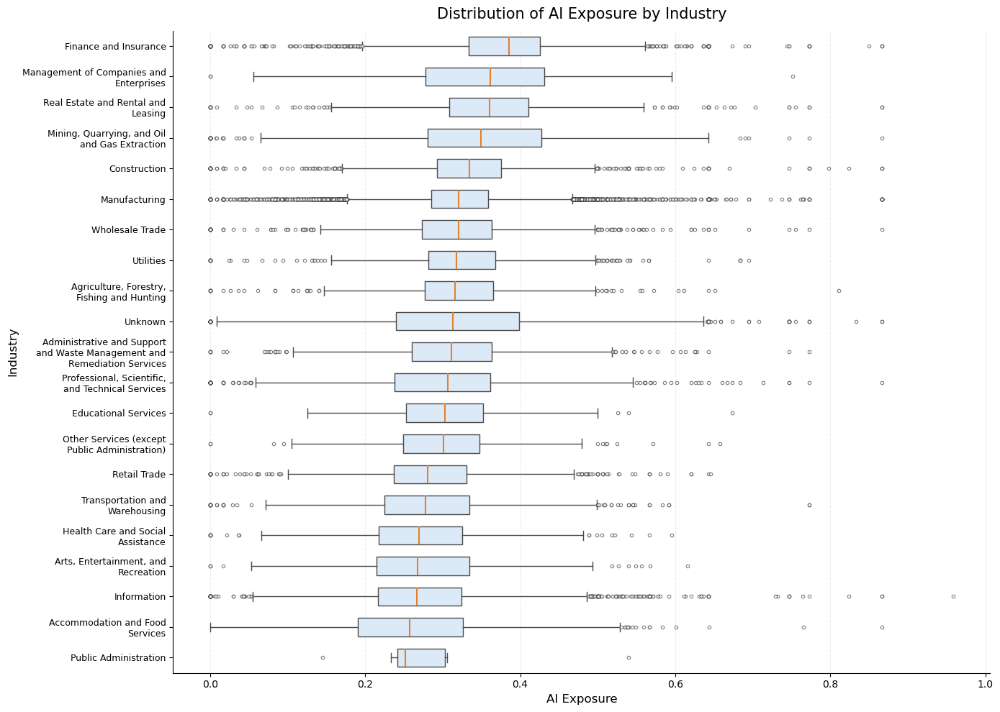

In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import textwrap

# -------------------------------------------------
# Prepare data
# -------------------------------------------------
df_plot = Public_Firm[["industry", "genai_rcid_total"]].copy()
df_plot["genai_rcid_total"] = pd.to_numeric(df_plot["genai_rcid_total"], errors="coerce")
df_plot = df_plot.dropna(subset=["industry", "genai_rcid_total"])

# Sort industries by median
industry_order = (
    df_plot.groupby("industry")["genai_rcid_total"]
    .median()
    .sort_values()
    .index
)

wrapped_labels = [textwrap.fill(ind, width=28) for ind in industry_order]

data_to_plot = [
    df_plot.loc[df_plot["industry"] == ind, "genai_rcid_total"].values
    for ind in industry_order
]

# -------------------------------------------------
# Plot
# -------------------------------------------------
fig, ax = plt.subplots(figsize=(14, 10), facecolor="white")
ax.set_facecolor("white")

bp = ax.boxplot(
    data_to_plot,
    tick_labels=wrapped_labels,
    vert=False,
    patch_artist=True,
    widths=0.6,
    showfliers=True,
    boxprops=dict(facecolor="#DCEAF7", edgecolor="#4A4A4A", linewidth=1.0),
    medianprops=dict(color="#E1812C", linewidth=1.5),
    whiskerprops=dict(color="#4A4A4A", linewidth=1.0),
    capprops=dict(color="#4A4A4A", linewidth=1.0),
    flierprops=dict(
        marker='o',
        markerfacecolor='white',
        markeredgecolor='#444444',
        markeredgewidth=0.8,
        markersize=3.2,
        alpha=0.7
    )
)

# Light x-grid only
ax.grid(axis="x", linestyle="--", alpha=0.25)
ax.grid(axis="y", visible=False)

# Clean spines
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# Labels and title
ax.set_xlabel("AI Exposure", fontsize=12)
ax.set_ylabel("Industry", fontsize=12)
ax.set_title("Distribution of AI Exposure by Industry", fontsize=15, pad=12)

# Ticks
ax.tick_params(axis="y", labelsize=9)
ax.tick_params(axis="x", labelsize=10)

plt.tight_layout()
plt.show()

In [9]:
Public_Firm

,rcid,genai_rcid_total,genai_rcid_core,total_positions,ticker,company,gvkey,top_core_positions,top_total_positions,naics_code,hq_country,industry_3code,industry_3digit
0,557687.0,0.457534,0.326423,2,APTY,"APT Systems, Inc.",19093,2.0,2.0,518210,United States,518,"Data Processing, Hosting, and Related Services"
2,573517.0,0.371970,0.285670,912,None,"TI Gotham, Inc.",19580,602.0,605.0,513120,United States,513,Unknown
4,592180.0,0.340438,0.261169,1491,None,"RS&H, Inc.",25722,1063.0,1161.0,541310,United States,541,"Professional, Scientific, and Technical Services"
7,603989.0,0.369328,0.289091,24,None,"Hospitality International, Inc.",5719,16.0,18.0,721110,United States,721,Accommodation
15,639453.0,0.255246,0.205630,16,ZAZA,ZaZa Energy Corp.,170773,8.0,7.0,211120,United States,211,Oil and Gas Extraction
...,...,...,...,...,...,...,...,...,...,...,...,...,...
50818,21019759.0,0.345718,0.288915,96,None,Innocoll Holdings Plc,20951,59.0,59.0,325412,United States,325,Chemical Manufacturing
50820,22142764.0,0.262057,0.187346,5109,USM,United States Cellular Corp.,14369,2143.0,2225.0,517112,United States,517,Telecommunications
50822,22150389.0,0.401881,0.293545,55,IPDN,"Professional Diversity Network, Inc.",8661,38.0,39.0,513140,United States,513,Unknown
50856,22215299.0,0.043478,0.043478,1,None,National Commerce Corp. (Alabama),23294,0.0,0.0,522110,United States,522,Credit Intermediation and Related Activities


In [19]:
Compustat_2022

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,au,auop,auopic,ceoso,cfoso,genai_rcid_total,rcid,naics_code,industry_3code,industry_3digit
0,1004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,6,1,1,Y,Y,0.237798,708822.0,336412,336,Transportation Equipment Manufacturing
2,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,11,1,1,Y,Y,0.362075,356507.0,333413,333,Machinery Manufacturing
4,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,5,1,1,Y,Y,0.326012,368391.0,221122,221,Utilities
5,1076,2022-12-31,2022,INDL,C,D,STD,PRG,74319R101,PROG HOLDINGS INC,...,4,1,1,Y,Y,0.330081,21042754.0,532490,532,Rental and Leasing Services
9,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,9,1,1,Y,Y,0.365209,1244385.0,423710,423,"Merchant Wholesalers, Durable Goods"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10507,345920,2022-12-31,2022,INDL,C,D,STD,HYFM,44888K407,HYDROFARM HLDNG GP INC,...,5,1,1,Y,Y,0.341255,21044566.0,333112,333,Machinery Manufacturing
10508,345980,2022-12-31,2022,INDL,C,D,STD,LOGCD,21078F109,CONTEXTLOGIC HOLDINGS INC,...,7,1,2,Y,Y,0.244492,1418727.0,523910,523,"Securities, Commodity Contracts, and Other Fin..."
10509,347007,2022-12-31,2022,INDL,C,D,STD,IBRX,45256X103,IMMUNITYBIO INC,...,4,1,1,Y,Y,0.324430,1194361.0,325412,325,Chemical Manufacturing
10516,349972,2022-12-31,2022,INDL,C,D,STD,INDP,45339J204,INDAPTUS THERAPEUTICS INC,...,9,1,0,Y,Y,0.427048,22268333.0,325412,325,Chemical Manufacturing


In [24]:
Compustat_2022[['naicsh','naics_code']]

,naicsh,naics_code
0,423860,336412
2,333413,333413
4,2211,221122
5,522220,532490
9,339113,423710
...,...,...
10507,333112,333112
10508,455110,523910
10509,325414,325412
10516,325414,325412


In [56]:
import pandas as pd

Compustat_2022["industry_3code_compustat"] = (
    Compustat_2022["naicsh"]
    .astype("string")
    .str.extract(r"^(\d{3})", expand=False)
)

In [57]:
import pandas as pd


# Map 3-digit NAICS to industry names
naics_3_map = {
    "111": "Crop Production",
    "112": "Animal Production and Aquaculture",
    "113": "Forestry and Logging",
    "114": "Fishing, Hunting and Trapping",
    "115": "Agriculture and Forestry Support Activities",
    
    "211": "Oil and Gas Extraction",
    "212": "Mining (except Oil and Gas)",
    "213": "Support Activities for Mining",
    
    "221": "Utilities",
    
    "236": "Construction of Buildings",
    "237": "Heavy and Civil Engineering Construction",
    "238": "Specialty Trade Contractors",
    
    "311": "Food Manufacturing",
    "312": "Beverage and Tobacco Product Manufacturing",
    "313": "Textile Mills",
    "314": "Textile Product Mills",
    "315": "Apparel Manufacturing",
    "316": "Leather and Allied Product Manufacturing",
    "321": "Wood Product Manufacturing",
    "322": "Paper Manufacturing",
    "323": "Printing and Related Support Activities",
    "324": "Petroleum and Coal Products Manufacturing",
    "325": "Chemical Manufacturing",
    "326": "Plastics and Rubber Products Manufacturing",
    "327": "Nonmetallic Mineral Product Manufacturing",
    "331": "Primary Metal Manufacturing",
    "332": "Fabricated Metal Product Manufacturing",
    "333": "Machinery Manufacturing",
    "334": "Computer and Electronic Product Manufacturing",
    "335": "Electrical Equipment, Appliance, and Component Manufacturing",
    "336": "Transportation Equipment Manufacturing",
    "337": "Furniture and Related Product Manufacturing",
    "339": "Miscellaneous Manufacturing",
    
    "423": "Merchant Wholesalers, Durable Goods",
    "424": "Merchant Wholesalers, Nondurable Goods",
    "425": "Wholesale Electronic Markets and Agents and Brokers",
    
    "441": "Motor Vehicle and Parts Dealers",
    "442": "Furniture and Home Furnishings Stores",
    "443": "Electronics and Appliance Stores",
    "444": "Building Material and Garden Equipment Stores",
    "445": "Food and Beverage Stores",
    "446": "Health and Personal Care Stores",
    "447": "Gasoline Stations",
    "448": "Clothing and Clothing Accessories Stores",
    "451": "Sporting Goods, Hobby, Book, and Music Stores",
    "452": "General Merchandise Stores",
    "453": "Miscellaneous Store Retailers",
    "454": "Nonstore Retailers",
    
    "481": "Air Transportation",
    "482": "Rail Transportation",
    "483": "Water Transportation",
    "484": "Truck Transportation",
    "485": "Transit and Ground Passenger Transportation",
    "486": "Pipeline Transportation",
    "487": "Scenic and Sightseeing Transportation",
    "488": "Support Activities for Transportation",
    "491": "Postal Service",
    "492": "Couriers and Messengers",
    "493": "Warehousing and Storage",
    
    "511": "Publishing Industries",
    "512": "Motion Picture and Sound Recording Industries",
    "515": "Broadcasting",
    "517": "Telecommunications",
    "518": "Data Processing, Hosting, and Related Services",
    "519": "Other Information Services",
    
    "521": "Monetary Authorities-Central Bank",
    "522": "Credit Intermediation and Related Activities",
    "523": "Securities, Commodity Contracts, and Other Financial Investments",
    "524": "Insurance Carriers and Related Activities",
    "525": "Funds, Trusts, and Other Financial Vehicles",
    
    "531": "Real Estate",
    "532": "Rental and Leasing Services",
    "533": "Lessors of Nonfinancial Intangible Assets",
    
    "541": "Professional, Scientific, and Technical Services",
    "551": "Management of Companies and Enterprises",
    "561": "Administrative and Support Services",
    "562": "Waste Management and Remediation Services",
    
    "611": "Educational Services",
    "621": "Ambulatory Health Care Services",
    "622": "Hospitals",
    "623": "Nursing and Residential Care Facilities",
    "624": "Social Assistance",
    
    "711": "Performing Arts, Spectator Sports, and Related Industries",
    "712": "Museums, Historical Sites, and Similar Institutions",
    "713": "Amusement, Gambling, and Recreation Industries",
    
    "721": "Accommodation",
    "722": "Food Services and Drinking Places",
    
    "811": "Repair and Maintenance",
    "812": "Personal and Laundry Services",
    "813": "Religious, Grantmaking, Civic, Professional, and Similar Organizations",
    
    "921": "Executive, Legislative, and Other General Government Support",
    "922": "Justice, Public Order, and Safety Activities",
    "923": "Administration of Human Resource Programs",
    "924": "Administration of Environmental Quality Programs",
    "925": "Administration of Housing Programs, Urban Planning, and Community Development",
    "926": "Administration of Economic Programs",
    "927": "Space Research and Technology",
    "928": "National Security and International Affairs",
}

Compustat_2022["industry_3digit_compustat"] = Compustat_2022["industry_3code_compustat"].map(naics_3_map).fillna("Unknown")

In [58]:
Compustat_2022

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,auopic,ceoso,cfoso,genai_rcid_total,rcid,naics_code,industry_3code,industry_3digit,industry_3code_compustat,industry_3digit_compustat
0,1004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,1,Y,Y,0.237798,708822.0,336412,336,Transportation Equipment Manufacturing,423,"Merchant Wholesalers, Durable Goods"
2,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,1,Y,Y,0.362075,356507.0,333413,333,Machinery Manufacturing,333,Machinery Manufacturing
4,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,1,Y,Y,0.326012,368391.0,221122,221,Utilities,221,Utilities
5,1076,2022-12-31,2022,INDL,C,D,STD,PRG,74319R101,PROG HOLDINGS INC,...,1,Y,Y,0.330081,21042754.0,532490,532,Rental and Leasing Services,522,Credit Intermediation and Related Activities
9,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,1,Y,Y,0.365209,1244385.0,423710,423,"Merchant Wholesalers, Durable Goods",339,Miscellaneous Manufacturing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10507,345920,2022-12-31,2022,INDL,C,D,STD,HYFM,44888K407,HYDROFARM HLDNG GP INC,...,1,Y,Y,0.341255,21044566.0,333112,333,Machinery Manufacturing,333,Machinery Manufacturing
10508,345980,2022-12-31,2022,INDL,C,D,STD,LOGCD,21078F109,CONTEXTLOGIC HOLDINGS INC,...,2,Y,Y,0.244492,1418727.0,523910,523,"Securities, Commodity Contracts, and Other Fin...",455,Unknown
10509,347007,2022-12-31,2022,INDL,C,D,STD,IBRX,45256X103,IMMUNITYBIO INC,...,1,Y,Y,0.324430,1194361.0,325412,325,Chemical Manufacturing,325,Chemical Manufacturing
10516,349972,2022-12-31,2022,INDL,C,D,STD,INDP,45339J204,INDAPTUS THERAPEUTICS INC,...,0,Y,Y,0.427048,22268333.0,325412,325,Chemical Manufacturing,325,Chemical Manufacturing


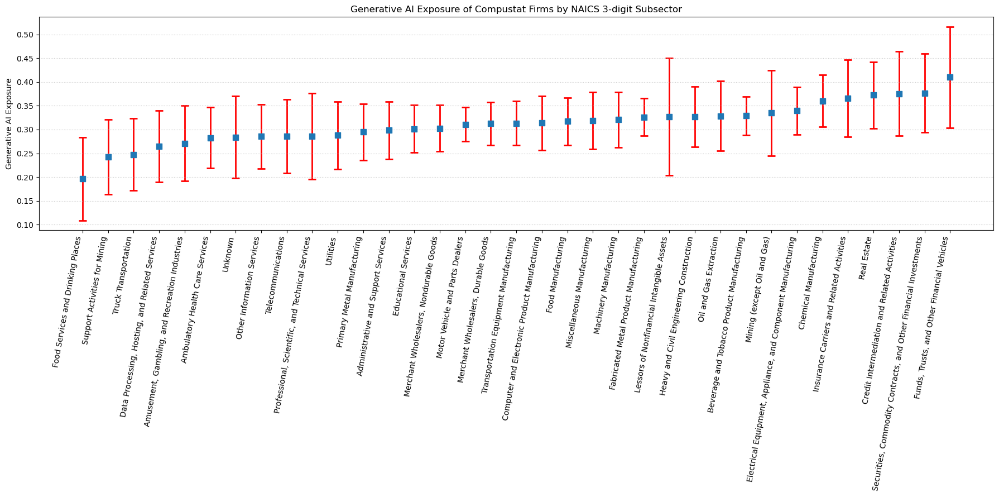

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# 1. Keep usable rows
# =========================================================
df_plot = Compustat_2022[["industry_3digit_compustat", "genai_rcid_total"]].copy()
df_plot["genai_rcid_total"] = pd.to_numeric(df_plot["genai_rcid_total"], errors="coerce")
df_plot = df_plot.dropna(subset=["industry_3digit_compustat", "genai_rcid_total"])

# =========================================================
# 2. Keep only industries with at least 20 firms
# =========================================================
industry_counts = (
    df_plot.groupby("industry_3digit_compustat")
    .size()
    .reset_index(name="n_firms")
)

valid_industries = industry_counts.loc[industry_counts["n_firms"] >= 20, "industry_3digit_compustat"]
df_plot = df_plot[df_plot["industry_3digit_compustat"].isin(valid_industries)].copy()

# =========================================================
# 3. Compute mean and standard deviation by 3-digit industry
# =========================================================
summary = (
    df_plot.groupby("industry_3digit_compustat")["genai_rcid_total"]
    .agg(["mean", "std", "count"])
    .reset_index()
    .rename(columns={"count": "n_firms"})
)

# Sort by mean exposure
summary = summary.sort_values("mean").reset_index(drop=True)

# =========================================================
# 4. Plot mean with red SD bars
# =========================================================
x = np.arange(len(summary))

fig, ax = plt.subplots(figsize=(18, 9))

# Red error bars only
ax.errorbar(
    x,
    summary["mean"],
    yerr=summary["std"],
    fmt="none",
    ecolor="red",
    elinewidth=2,
    capsize=5,
    capthick=2,
    zorder=1
)

# Blue square markers for means
ax.scatter(
    x,
    summary["mean"],
    marker="s",
    s=55,
    zorder=2
)

# Axis labels and title
ax.set_xticks(x)
ax.set_xticklabels(summary["industry_3digit_compustat"], rotation=80, ha="right")
ax.set_ylabel("Generative AI Exposure")
ax.set_xlabel("")
ax.set_title("Generative AI Exposure of Compustat Firms by NAICS 3-digit Subsector")

# Grid and style
ax.grid(axis="y", linestyle=":", alpha=0.7)
ax.grid(axis="x", visible=False)

plt.tight_layout()
plt.show()

**Occupation Heat Map**

In [31]:
import pandas as pd
Occ_Exposure = pd.read_csv(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Occupation Gen AI Exposure\Occ_GenAI_Exposure.csv")
Occ_Exposure

,soc2010,genaiexp_estz_total,genaiexp_estz_core,genaiexp_estz_supplemental
0,11-1011,0.479391,0.422939,0.056452
1,11-1021,0.294118,0.117647,0.176471
2,11-1031,0.216667,0.216667,0.000000
3,11-2011,0.366667,0.300000,0.066667
4,11-2021,0.450000,0.300000,0.150000
...,...,...,...,...
835,55-3015,NaN,NaN,NaN
836,55-3016,NaN,NaN,NaN
837,55-3017,0.178125,0.112500,0.065625
838,55-3018,NaN,NaN,NaN


In [32]:
rcid_onet_code_counts = pd.read_parquet(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Occupation Gen AI Exposure\rcid_onet_code_counts (1).parquet")
rcid_onet_code_counts

,rcid,onet_code,n_positions
0,1086669.0,11-2022.00,230
1,NaN,35-2014.00,365906
2,93495551.0,29-1122.00,3959
3,93710423.0,41-2031.00,2664
4,6871688.0,11-3131.00,2
...,...,...,...
79651760,1396440.0,33-9092.00,1
79651761,1297230.0,27-3043.00,1
79651762,7667782.0,13-1071.00,1
79651763,92953680.0,43-5061.00,1


In [33]:
rcid_onet_code_counts["soc2010"] = (
    rcid_onet_code_counts["onet_code"]
    .astype("string")
    .str.split(".", n=1)
    .str[0]
)

rcid_onet_code_counts[["onet_code", "soc2010"]].head()

,onet_code,soc2010
0,11-2022.00,11-2022
1,35-2014.00,35-2014
2,29-1122.00,29-1122
3,41-2031.00,41-2031
4,11-3131.00,11-3131


In [34]:
rcid_onet_code_counts

,rcid,onet_code,n_positions,soc2010
0,1086669.0,11-2022.00,230,11-2022
1,NaN,35-2014.00,365906,35-2014
2,93495551.0,29-1122.00,3959,29-1122
3,93710423.0,41-2031.00,2664,41-2031
4,6871688.0,11-3131.00,2,11-3131
...,...,...,...,...
79651760,1396440.0,33-9092.00,1,33-9092
79651761,1297230.0,27-3043.00,1,27-3043
79651762,7667782.0,13-1071.00,1,13-1071
79651763,92953680.0,43-5061.00,1,43-5061


In [35]:
rcid_onet_code_counts = rcid_onet_code_counts.merge(
    Occ_Exposure[["soc2010", "genaiexp_estz_total"]],
    on="soc2010",how="left")

rcid_onet_code_counts

,rcid,onet_code,n_positions,soc2010,genaiexp_estz_total
0,1086669.0,11-2022.00,230,11-2022,0.294118
1,NaN,35-2014.00,365906,35-2014,0.075000
2,93495551.0,29-1122.00,3959,29-1122,0.150560
3,93710423.0,41-2031.00,2664,41-2031,0.208333
4,6871688.0,11-3131.00,2,11-3131,0.500000
...,...,...,...,...,...
79651760,1396440.0,33-9092.00,1,33-9092,0.000000
79651761,1297230.0,27-3043.00,1,27-3043,0.746875
79651762,7667782.0,13-1071.00,1,13-1071,0.442308
79651763,92953680.0,43-5061.00,1,43-5061,0.764706


In [41]:
Occu_Name = pd.read_excel(r"C:\Users\82383\Downloads\2010_Occupations.xlsx")
Occu_Name

,O*NET-SOC 2010 Code,O*NET-SOC 2010 Title,O*NET-SOC 2010 Description
0,11-1011.00,Chief Executives,Determine and formulate policies and provide o...
1,11-1011.03,Chief Sustainability Officers,"Communicate and coordinate with management, sh..."
2,11-1021.00,General and Operations Managers,"Plan, direct, or coordinate the operations of ..."
3,11-1031.00,Legislators,"Develop, introduce or enact laws and statutes ..."
4,11-2011.00,Advertising and Promotions Managers,"Plan, direct, or coordinate advertising polici..."
...,...,...,...
1105,55-3015.00,Command and Control Center Specialists,"Operate and monitor communications, detection,..."
1106,55-3016.00,Infantry,Operate weapons and equipment in ground combat...
1107,55-3017.00,Radar and Sonar Technicians,Operate equipment using radio or sound wave te...
1108,55-3018.00,Special Forces,"Implement unconventional operations by air, la..."


In [42]:
# Keep only occupations whose O*NET-SOC 2010 Code ends with ".00"
Occu_Name = Occu_Name[
    Occu_Name["O*NET-SOC 2010 Code"].astype(str).str.endswith(".00", na=False)
].copy()

Occu_Name["soc2010"] = (
    Occu_Name["O*NET-SOC 2010 Code"]
    .astype("string")
    .str.split(".", n=1)
    .str[0]
)

Occu_Name

,O*NET-SOC 2010 Code,O*NET-SOC 2010 Title,O*NET-SOC 2010 Description,soc2010
0,11-1011.00,Chief Executives,Determine and formulate policies and provide o...,11-1011
2,11-1021.00,General and Operations Managers,"Plan, direct, or coordinate the operations of ...",11-1021
3,11-1031.00,Legislators,"Develop, introduce or enact laws and statutes ...",11-1031
4,11-2011.00,Advertising and Promotions Managers,"Plan, direct, or coordinate advertising polici...",11-2011
6,11-2021.00,Marketing Managers,"Plan, direct, or coordinate marketing policies...",11-2021
...,...,...,...,...
1105,55-3015.00,Command and Control Center Specialists,"Operate and monitor communications, detection,...",55-3015
1106,55-3016.00,Infantry,Operate weapons and equipment in ground combat...,55-3016
1107,55-3017.00,Radar and Sonar Technicians,Operate equipment using radio or sound wave te...,55-3017
1108,55-3018.00,Special Forces,"Implement unconventional operations by air, la...",55-3018


In [43]:
rcid_onet_code_counts = rcid_onet_code_counts.merge(
    Occu_Name[["soc2010", "O*NET-SOC 2010 Title"]],
    on="soc2010",
    how="left"
)

rcid_onet_code_counts

,rcid,onet_code,n_positions,soc2010,genaiexp_estz_total,O*NET-SOC 2010 Title
0,1086669.0,11-2022.00,230,11-2022,0.294118,Sales Managers
1,NaN,35-2014.00,365906,35-2014,0.075000,"Cooks, Restaurant"
2,93495551.0,29-1122.00,3959,29-1122,0.150560,Occupational Therapists
3,93710423.0,41-2031.00,2664,41-2031,0.208333,Retail Salespersons
4,6871688.0,11-3131.00,2,11-3131,0.500000,Training and Development Managers
...,...,...,...,...,...,...
79651760,1396440.0,33-9092.00,1,33-9092,0.000000,"Lifeguards, Ski Patrol, and Other Recreational..."
79651761,1297230.0,27-3043.00,1,27-3043,0.746875,Writers and Authors
79651762,7667782.0,13-1071.00,1,13-1071,0.442308,Human Resources Specialists
79651763,92953680.0,43-5061.00,1,43-5061,0.764706,"Production, Planning, and Expediting Clerks"


In [46]:
Compustat_2022

,gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,cusip,conm,...,auopic,ceoso,cfoso,genai_rcid_total,rcid,naics_code,industry_3code,industry_3digit,industry_3code_compustat,industry_3digit_compustat
0,1004,2023-05-31,2022,INDL,C,D,STD,AIR,000361105,AAR CORP,...,1,Y,Y,0.237798,708822.0,336412,336,Transportation Equipment Manufacturing,423,"Merchant Wholesalers, Durable Goods"
2,1050,2022-12-31,2022,INDL,C,D,STD,CECO,125141101,CECO ENVIRONMENTAL CORP,...,1,Y,Y,0.362075,356507.0,333413,333,Machinery Manufacturing,333,Machinery Manufacturing
4,1075,2022-12-31,2022,INDL,C,D,STD,PNW,723484101,PINNACLE WEST CAPITAL CORP,...,1,Y,Y,0.326012,368391.0,221122,221,Utilities,221,Utilities
5,1076,2022-12-31,2022,INDL,C,D,STD,PRG,74319R101,PROG HOLDINGS INC,...,1,Y,Y,0.330081,21042754.0,532490,532,Rental and Leasing Services,522,Credit Intermediation and Related Activities
9,1104,2022-12-31,2022,INDL,C,D,STD,ACU,004816104,ACME UNITED CORP,...,1,Y,Y,0.365209,1244385.0,423710,423,"Merchant Wholesalers, Durable Goods",339,Miscellaneous Manufacturing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10507,345920,2022-12-31,2022,INDL,C,D,STD,HYFM,44888K407,HYDROFARM HLDNG GP INC,...,1,Y,Y,0.341255,21044566.0,333112,333,Machinery Manufacturing,333,Machinery Manufacturing
10508,345980,2022-12-31,2022,INDL,C,D,STD,LOGCD,21078F109,CONTEXTLOGIC HOLDINGS INC,...,2,Y,Y,0.244492,1418727.0,523910,523,"Securities, Commodity Contracts, and Other Fin...",455,Unknown
10509,347007,2022-12-31,2022,INDL,C,D,STD,IBRX,45256X103,IMMUNITYBIO INC,...,1,Y,Y,0.324430,1194361.0,325412,325,Chemical Manufacturing,325,Chemical Manufacturing
10516,349972,2022-12-31,2022,INDL,C,D,STD,INDP,45339J204,INDAPTUS THERAPEUTICS INC,...,0,Y,Y,0.427048,22268333.0,325412,325,Chemical Manufacturing,325,Chemical Manufacturing


In [ ]:
# Keep only rows in rcid_onet_code_counts whose rcid appears in Compustat_2022
compustat_rcids = Compustat_2022["rcid"].dropna().unique()

rcid_onet_code_counts = rcid_onet_code_counts[
    rcid_onet_code_counts["rcid"].isin(compustat_rcids)
].copy()

rcid_onet_code_counts

**Pre Regression Preparation**

In [98]:
Compustat_2022_Treated_Matched_Control

,match_id,match_role,gvkey,matched_pair_gvkey,treated_id,control_id,industry,mahalanobis_distance,neighbor_rank,n_exact_matches_raw,...,rank,au,auop,auopic,ceoso,cfoso,rcid,naics2,market_equity,n_maha_available
0,0,treated,1050,106965,1050,106965,Manufacturing,0.067197,1,1398,...,1,11,1,1,Y,Y,356507.0,33,401.58176,4
1,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,1,9,4,0,Y,Y,566399.0,33,180.09600,4
2,1,treated,1075,4383,1075,4383,Utilities,0.117965,1,105,...,1,5,1,1,Y,Y,368391.0,22,8605.67492,4
3,1,control,4383,1075,1075,4383,Utilities,0.117965,1,105,...,1,4,1,1,Y,Y,327070.0,22,14350.35945,4
4,2,treated,1104,61122,1104,61122,Wholesale Trade,0.539578,1,65,...,1,9,1,1,Y,Y,1244385.0,42,77.48220,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3617,1830,control,31823,343180,343180,31823,Manufacturing,2.304092,1,703,...,1,5,4,1,Y,Y,137843.0,32,58.30920,4
3618,1831,treated,349972,4579,349972,4579,Manufacturing,7.303956,1,702,...,1,9,1,0,Y,Y,22268333.0,32,12.18145,4
3619,1831,control,4579,349972,349972,4579,Manufacturing,7.303956,1,702,...,1,17,1,1,Y,Y,385194.0,31,86.60085,4
3620,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,1,9,1,0,Y,Y,22267994.0,32,6.88274,4


In [99]:
import pandas as pd
import numpy as np
from pathlib import Path

# =========================================================
# Paths
# =========================================================
matched_path = Path(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Compustat_2022_Treated_Matched_Control.parquet")
funda_dir = Path(r"C:\Users\82383\UF Dropbox\Wang Boyu\AI Financing\Data\Compustat Fundamental Annual")
output_path = Path(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Compustat_2019_2025_Treated_Matched_Control_Panel.parquet")

# Only add these years; 2022 already exists in matched file
extra_years = [2019, 2020, 2021, 2023, 2024, 2025]

# =========================================================
# 1. Read matched 2022 base file
# =========================================================
matched_2022 = pd.read_parquet(matched_path).copy()

matched_2022["gvkey"] = pd.to_numeric(matched_2022["gvkey"], errors="coerce").astype("Int64")

# Force fyear = 2022 for the base matched file
matched_2022["fyear"] = 2022

print("Rows in 2022 matched base:", len(matched_2022))
print("Unique gvkey in 2022 matched base:", matched_2022["gvkey"].nunique())

# =========================================================
# 2. Create skeleton for the six additional years
# =========================================================
year_df = pd.DataFrame({"fyear": extra_years})

matched_other_years = (
    matched_2022.drop(columns=["fyear"], errors="ignore")
    .assign(_tmp_key=1)
    .merge(year_df.assign(_tmp_key=1), on="_tmp_key", how="outer")
    .drop(columns="_tmp_key")
)

print("Rows in additional-year skeleton:", len(matched_other_years))

# =========================================================
# 3. Read and stack funda files for 2019, 2020, 2021, 2023, 2024, 2025
# =========================================================
funda_list = []

for yr in extra_years:
    funda_path = funda_dir / f"funda-{yr}.parquet"
    if not funda_path.exists():
        print(f"Warning: file not found -> {funda_path}")
        continue

    df = pd.read_parquet(funda_path).copy()

    if "gvkey" not in df.columns:
        print(f"Warning: gvkey not found in {funda_path}")
        continue

    df["gvkey"] = pd.to_numeric(df["gvkey"], errors="coerce").astype("Int64")

    if "fyear" not in df.columns:
        print(f"Warning: fyear not found in {funda_path}")
        continue

    df["fyear"] = pd.to_numeric(df["fyear"], errors="coerce").astype("Int64")
    df = df[df["fyear"] == yr].copy()

    funda_list.append(df)
    print(f"Loaded funda-{yr}: rows = {len(df)}")

if len(funda_list) == 0:
    raise ValueError("No funda files were loaded. Please check the file paths.")

funda_extra = pd.concat(funda_list, ignore_index=True, sort=False)

print("Total rows in stacked extra-year funda:", len(funda_extra))

# =========================================================
# 4. Drop duplicate gvkey-fyear in funda if needed
# =========================================================
dup_count = funda_extra.duplicated(subset=["gvkey", "fyear"]).sum()
print("Duplicate gvkey-fyear in funda_extra:", dup_count)

if dup_count > 0:
    funda_extra = funda_extra.drop_duplicates(subset=["gvkey", "fyear"], keep="first").copy()
    print("Rows after dropping duplicate gvkey-fyear:", len(funda_extra))

# =========================================================
# 5. Merge additional-year skeleton with extra-year funda
# =========================================================
panel_extra = matched_other_years.merge(
    funda_extra,
    on=["gvkey", "fyear"],
    how="left",
    suffixes=("", "_funda")
)

print("Rows after merging additional years with funda:", len(panel_extra))

# =========================================================
# 6. If a column exists in both matched skeleton and funda,
#    use funda value when available, otherwise keep matched value
# =========================================================
funda_suffix_cols = [c for c in panel_extra.columns if c.endswith("_funda")]

for funda_col_with_suffix in funda_suffix_cols:
    base_col = funda_col_with_suffix[:-6]  # remove "_funda"

    if base_col in panel_extra.columns:
        panel_extra[base_col] = panel_extra[funda_col_with_suffix].combine_first(panel_extra[base_col])
        panel_extra.drop(columns=[funda_col_with_suffix], inplace=True)
    else:
        panel_extra.rename(columns={funda_col_with_suffix: base_col}, inplace=True)

# =========================================================
# 7. Stack original 2022 file with the six added years
# =========================================================
final_panel = pd.concat([matched_2022, panel_extra], ignore_index=True, sort=False)

# Ensure gvkey and fyear are clean
final_panel["gvkey"] = pd.to_numeric(final_panel["gvkey"], errors="coerce").astype("Int64")
final_panel["fyear"] = pd.to_numeric(final_panel["fyear"], errors="coerce").astype("Int64")

# =========================================================
# 8. Reorder columns
# =========================================================
front_cols = [
    "match_id",
    "match_role",
    "gvkey",
    "matched_pair_gvkey",
    "treated_id",
    "control_id",
    "industry",
    "mahalanobis_distance",
    "neighbor_rank",
    "n_exact_matches_raw",
    "n_exact_matches",
    "n_common_vars",
    "used_vars",
    "High_Exposure",
    "genai_rcid_total",
    "fyear",
    "datadate"
]

front_cols_existing = [c for c in front_cols if c in final_panel.columns]
other_cols = [c for c in final_panel.columns if c not in front_cols_existing]

final_panel = final_panel[front_cols_existing + other_cols].copy()

# =========================================================
# 9. Sort final panel
# =========================================================
sort_cols = [c for c in ["match_id", "match_role", "gvkey", "fyear"] if c in final_panel.columns]
final_panel = final_panel.sort_values(sort_cols).reset_index(drop=True)

# =========================================================
# 10. Save final panel
# =========================================================
final_panel.to_parquet(output_path, index=False)

print("\nDone.")
print("Final panel rows:", len(final_panel))
print("Final panel unique gvkey:", final_panel["gvkey"].nunique())
print("Final panel years:", sorted(final_panel["fyear"].dropna().unique().tolist()))
print("Saved to:")
print(output_path)

Rows in 2022 matched base: 3622
Unique gvkey in 2022 matched base: 3622
Rows in additional-year skeleton: 21732
Loaded funda-2019: rows = 19573
Loaded funda-2020: rows = 20100
Loaded funda-2021: rows = 20462
Loaded funda-2023: rows = 20570
Loaded funda-2024: rows = 20190
Loaded funda-2025: rows = 13479


C:\Users\82383\AppData\Local\Temp\ipykernel_11464\1262188450.py:74: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  funda_extra = pd.concat(funda_list, ignore_index=True, sort=False)


Total rows in stacked extra-year funda: 114374
Duplicate gvkey-fyear in funda_extra: 43161
Rows after dropping duplicate gvkey-fyear: 71213
Rows after merging additional years with funda: 21732

Done.
Final panel rows: 25354
Final panel unique gvkey: 3622
Final panel years: [2019, 2020, 2021, 2022, 2023, 2024, 2025]
Saved to:
E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Compustat_2019_2025_Treated_Matched_Control_Panel.parquet


In [100]:
Compustat_2019_2025_Treated_Matched_Control = pd.read_parquet(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Compustat_2019_2025_Treated_Matched_Control_Panel.parquet")
Compustat_2019_2025_Treated_Matched_Control


,match_id,match_role,gvkey,matched_pair_gvkey,treated_id,control_id,industry,mahalanobis_distance,neighbor_rank,n_exact_matches_raw,...,au,auop,auopic,ceoso,cfoso,rcid,naics2,market_equity,n_maha_available,hiid
0,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,9,1,0,Y,Y,566399.0,33,180.09600,4,<NA>
1,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,9,1,0,Y,Y,566399.0,33,180.09600,4,<NA>
2,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,9,1,0,Y,Y,566399.0,33,180.09600,4,<NA>
3,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,9,4,0,Y,Y,566399.0,33,180.09600,4,<NA>
4,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,6,1,0,Y,Y,566399.0,33,180.09600,4,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25349,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,9,1,0,E,E,22267994.0,32,6.88274,4,<NA>
25350,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,9,1,0,Y,Y,22267994.0,32,6.88274,4,<NA>
25351,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,9,1,0,Y,Y,22267994.0,32,6.88274,4,<NA>
25352,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,9,1,0,Y,Y,22267994.0,32,6.88274,4,<NA>


In [101]:
import pandas as pd
import numpy as np

# Convert to regular numeric float columns
cols_to_numeric = ["at", "oibdp", "ppent", "prcc_f", "csho", "ceq"]
for col in cols_to_numeric:
    Compustat_2019_2025_Treated_Matched_Control[col] = pd.to_numeric(Compustat_2019_2025_Treated_Matched_Control[col], errors="coerce").astype(float)

# 1. Ln(Total assets)
Compustat_2019_2025_Treated_Matched_Control["ln_at"] = np.where(
    Compustat_2019_2025_Treated_Matched_Control["at"].notna() & (Compustat_2019_2025_Treated_Matched_Control["at"] > 0),
    np.log(Compustat_2019_2025_Treated_Matched_Control["at"]),
    np.nan
)

# 2. Profitability = EBITDA / Total Assets
Compustat_2019_2025_Treated_Matched_Control["profitability"] = np.where(
    Compustat_2019_2025_Treated_Matched_Control["at"].notna() & (Compustat_2019_2025_Treated_Matched_Control["at"] > 0),
    Compustat_2019_2025_Treated_Matched_Control["oibdp"] / Compustat_2019_2025_Treated_Matched_Control["at"],
    np.nan
)

# 3. Tangibility = PP&E / Total Assets
Compustat_2019_2025_Treated_Matched_Control["tangibility"] = np.where(
    Compustat_2019_2025_Treated_Matched_Control["at"].notna() & (Compustat_2019_2025_Treated_Matched_Control["at"] > 0),
    Compustat_2019_2025_Treated_Matched_Control["ppent"] / Compustat_2019_2025_Treated_Matched_Control["at"],
    np.nan
)

# 4. Market equity and market-to-book ratio
Compustat_2019_2025_Treated_Matched_Control["market_equity"] = Compustat_2019_2025_Treated_Matched_Control["prcc_f"] * Compustat_2019_2025_Treated_Matched_Control["csho"]

Compustat_2019_2025_Treated_Matched_Control["market_to_book"] = np.where(
    Compustat_2019_2025_Treated_Matched_Control["ceq"].notna() & (Compustat_2019_2025_Treated_Matched_Control["ceq"] > 0),
    Compustat_2019_2025_Treated_Matched_Control["market_equity"] / Compustat_2019_2025_Treated_Matched_Control["ceq"],
    np.nan
)

Compustat_2019_2025_Treated_Matched_Control[[
    "gvkey", "datadate", "ln_at", "profitability", "tangibility", "market_equity", "market_to_book"
]]

c:\Users\82383\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,gvkey,datadate,ln_at,profitability,tangibility,market_equity,market_to_book
0,106965,2019-06-30,4.568651,0.145736,0.025142,83.679960,2.000525
1,106965,2020-06-30,5.168966,0.129207,0.109149,181.850320,2.431707
2,106965,2021-06-30,6.506839,0.043519,0.039202,424.754880,0.911090
3,106965,2022-06-30,6.211670,0.067847,0.054656,180.096000,0.612972
4,106965,2023-06-30,6.092996,0.095269,0.050377,122.240600,0.459353
...,...,...,...,...,...,...,...
25349,351038,2021-12-31,2.236125,-0.636849,0.000000,15.264340,23.233394
25350,351038,2022-12-31,2.671248,-0.633075,0.000000,6.882740,0.929221
25351,351038,2023-12-31,2.498892,-0.762183,0.000000,4.841235,0.854738
25352,351038,2024-12-31,2.754234,-0.600166,0.000000,5.822464,0.632533


In [104]:
Compustat_2019_2025_Treated_Matched_Control

,match_id,match_role,gvkey,matched_pair_gvkey,treated_id,control_id,industry,mahalanobis_distance,neighbor_rank,n_exact_matches_raw,...,au,auop,auopic,ceoso,cfoso,rcid,naics2,market_equity,n_maha_available,hiid
0,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,9,1,0,Y,Y,566399.0,33,83.679960,4,<NA>
1,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,9,1,0,Y,Y,566399.0,33,181.850320,4,<NA>
2,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,9,1,0,Y,Y,566399.0,33,424.754880,4,<NA>
3,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,9,4,0,Y,Y,566399.0,33,180.096000,4,<NA>
4,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,6,1,0,Y,Y,566399.0,33,122.240600,4,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25349,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,9,1,0,E,E,22267994.0,32,15.264340,4,<NA>
25350,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,9,1,0,Y,Y,22267994.0,32,6.882740,4,<NA>
25351,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,9,1,0,Y,Y,22267994.0,32,4.841235,4,<NA>
25352,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,9,1,0,Y,Y,22267994.0,32,5.822464,4,<NA>


In [103]:
Compustat_2022_Treated_Matched_Control

,match_id,match_role,gvkey,matched_pair_gvkey,treated_id,control_id,industry,mahalanobis_distance,neighbor_rank,n_exact_matches_raw,...,rank,au,auop,auopic,ceoso,cfoso,rcid,naics2,market_equity,n_maha_available
0,0,treated,1050,106965,1050,106965,Manufacturing,0.067197,1,1398,...,1,11,1,1,Y,Y,356507.0,33,401.58176,4
1,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,1,9,4,0,Y,Y,566399.0,33,180.09600,4
2,1,treated,1075,4383,1075,4383,Utilities,0.117965,1,105,...,1,5,1,1,Y,Y,368391.0,22,8605.67492,4
3,1,control,4383,1075,1075,4383,Utilities,0.117965,1,105,...,1,4,1,1,Y,Y,327070.0,22,14350.35945,4
4,2,treated,1104,61122,1104,61122,Wholesale Trade,0.539578,1,65,...,1,9,1,1,Y,Y,1244385.0,42,77.48220,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3617,1830,control,31823,343180,343180,31823,Manufacturing,2.304092,1,703,...,1,5,4,1,Y,Y,137843.0,32,58.30920,4
3618,1831,treated,349972,4579,349972,4579,Manufacturing,7.303956,1,702,...,1,9,1,0,Y,Y,22268333.0,32,12.18145,4
3619,1831,control,4579,349972,349972,4579,Manufacturing,7.303956,1,702,...,1,17,1,1,Y,Y,385194.0,31,86.60085,4
3620,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,1,9,1,0,Y,Y,22267994.0,32,6.88274,4


In [105]:
# Add Post indicator: 0 for 2019-2022, 1 for 2023-2025
Compustat_2019_2025_Treated_Matched_Control["Post"] = (
    Compustat_2019_2025_Treated_Matched_Control["fyear"]
    .astype("Int64")
    .isin([2023, 2024, 2025])
    .astype(int)
)
Compustat_2019_2025_Treated_Matched_Control


,match_id,match_role,gvkey,matched_pair_gvkey,treated_id,control_id,industry,mahalanobis_distance,neighbor_rank,n_exact_matches_raw,...,auop,auopic,ceoso,cfoso,rcid,naics2,market_equity,n_maha_available,hiid,Post
0,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,1,0,Y,Y,566399.0,33,83.679960,4,<NA>,0
1,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,1,0,Y,Y,566399.0,33,181.850320,4,<NA>,0
2,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,1,0,Y,Y,566399.0,33,424.754880,4,<NA>,0
3,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,4,0,Y,Y,566399.0,33,180.096000,4,<NA>,0
4,0,control,106965,1050,1050,106965,Manufacturing,0.067197,1,1398,...,1,0,Y,Y,566399.0,33,122.240600,4,<NA>,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25349,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,1,0,E,E,22267994.0,32,15.264340,4,<NA>,0
25350,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,1,0,Y,Y,22267994.0,32,6.882740,4,<NA>,0
25351,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,1,0,Y,Y,22267994.0,32,4.841235,4,<NA>,1
25352,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,1,0,Y,Y,22267994.0,32,5.822464,4,<NA>,1


**Construct Outcome Variables: Debt Issuance, Equity Issurance, Market Leverage and Book Leverage**

In [107]:
# =========================================================
# Make sure needed columns are numeric FLOAT
# =========================================================
cols_needed = [
    "gvkey", "fyear",
    "dltis",   # long-term debt issuance
    "dltr",    # long-term debt reduction
    "sstk",    # stock issuance
    "prstkc",  # stock repurchase / redemption
    "dltt",    # long-term debt
    "dlc",     # debt in current liabilities
    "prcc_f",  # fiscal year-end price
    "csho",    # common shares outstanding
    "ceq"      # common equity
]

for col in cols_needed:
    if col in Compustat_2019_2025_Treated_Matched_Control.columns:
        Compustat_2019_2025_Treated_Matched_Control[col] = pd.to_numeric(
            Compustat_2019_2025_Treated_Matched_Control[col],
            errors="coerce"
        ).astype(float)

# gvkey / fyear if you want to keep as integer-like identifiers
Compustat_2019_2025_Treated_Matched_Control["gvkey"] = pd.to_numeric(
    Compustat_2019_2025_Treated_Matched_Control["gvkey"], errors="coerce"
).astype("Int64")

Compustat_2019_2025_Treated_Matched_Control["fyear"] = pd.to_numeric(
    Compustat_2019_2025_Treated_Matched_Control["fyear"], errors="coerce"
).astype("Int64")

# =========================================================
# Sort by firm-year
# =========================================================
Compustat_2019_2025_Treated_Matched_Control = (
    Compustat_2019_2025_Treated_Matched_Control
    .sort_values(["gvkey", "fyear"])
    .reset_index(drop=True)
)

# =========================================================
# Construct building blocks
# =========================================================
# Total debt
Compustat_2019_2025_Treated_Matched_Control["total_debt"] = (
    Compustat_2019_2025_Treated_Matched_Control["dltt"].fillna(0.0)
    + Compustat_2019_2025_Treated_Matched_Control["dlc"].fillna(0.0)
)

# Market equity
Compustat_2019_2025_Treated_Matched_Control["market_equity"] = (
    Compustat_2019_2025_Treated_Matched_Control["prcc_f"]
    * Compustat_2019_2025_Treated_Matched_Control["csho"]
)

# Lags
Compustat_2019_2025_Treated_Matched_Control["lag_total_debt"] = (
    Compustat_2019_2025_Treated_Matched_Control
    .groupby("gvkey")["total_debt"]
    .shift(1)
)

Compustat_2019_2025_Treated_Matched_Control["lag_market_equity"] = (
    Compustat_2019_2025_Treated_Matched_Control
    .groupby("gvkey")["market_equity"]
    .shift(1)
)

Compustat_2019_2025_Treated_Matched_Control["lag_debt_plus_me"] = (
    Compustat_2019_2025_Treated_Matched_Control["lag_total_debt"]
    + Compustat_2019_2025_Treated_Matched_Control["lag_market_equity"]
)

# =========================================================
# Construct the four variables
# =========================================================

# 1. Debt issuance
Compustat_2019_2025_Treated_Matched_Control["debt_issuance"] = (
    (
        Compustat_2019_2025_Treated_Matched_Control["dltis"].fillna(0.0)
        - Compustat_2019_2025_Treated_Matched_Control["dltr"].fillna(0.0)
    )
    / Compustat_2019_2025_Treated_Matched_Control["lag_debt_plus_me"]
)

Compustat_2019_2025_Treated_Matched_Control.loc[
    Compustat_2019_2025_Treated_Matched_Control["lag_debt_plus_me"].isna()
    | (Compustat_2019_2025_Treated_Matched_Control["lag_debt_plus_me"] <= 0),
    "debt_issuance"
] = np.nan

# 2. Equity issuance
Compustat_2019_2025_Treated_Matched_Control["equity_issuance"] = (
    (
        Compustat_2019_2025_Treated_Matched_Control["sstk"].fillna(0.0)
        - Compustat_2019_2025_Treated_Matched_Control["prstkc"].fillna(0.0)
    )
    / Compustat_2019_2025_Treated_Matched_Control["lag_debt_plus_me"]
)

Compustat_2019_2025_Treated_Matched_Control.loc[
    Compustat_2019_2025_Treated_Matched_Control["lag_debt_plus_me"].isna()
    | (Compustat_2019_2025_Treated_Matched_Control["lag_debt_plus_me"] <= 0),
    "equity_issuance"
] = np.nan

# 3. Market leverage
Compustat_2019_2025_Treated_Matched_Control["debt_plus_me"] = (
    Compustat_2019_2025_Treated_Matched_Control["total_debt"]
    + Compustat_2019_2025_Treated_Matched_Control["market_equity"]
)

Compustat_2019_2025_Treated_Matched_Control["market_leverage"] = (
    Compustat_2019_2025_Treated_Matched_Control["total_debt"]
    / Compustat_2019_2025_Treated_Matched_Control["debt_plus_me"]
)

Compustat_2019_2025_Treated_Matched_Control.loc[
    Compustat_2019_2025_Treated_Matched_Control["debt_plus_me"].isna()
    | (Compustat_2019_2025_Treated_Matched_Control["debt_plus_me"] <= 0),
    "market_leverage"
] = np.nan

# 4. Book leverage
Compustat_2019_2025_Treated_Matched_Control["debt_plus_ceq"] = (
    Compustat_2019_2025_Treated_Matched_Control["total_debt"]
    + Compustat_2019_2025_Treated_Matched_Control["ceq"]
)

Compustat_2019_2025_Treated_Matched_Control["book_leverage"] = (
    Compustat_2019_2025_Treated_Matched_Control["total_debt"]
    / Compustat_2019_2025_Treated_Matched_Control["debt_plus_ceq"]
)

Compustat_2019_2025_Treated_Matched_Control.loc[
    Compustat_2019_2025_Treated_Matched_Control["debt_plus_ceq"].isna()
    | (Compustat_2019_2025_Treated_Matched_Control["debt_plus_ceq"] <= 0),
    "book_leverage"
] = np.nan

Compustat_2019_2025_Treated_Matched_Control

,match_id,match_role,gvkey,matched_pair_gvkey,treated_id,control_id,industry,mahalanobis_distance,neighbor_rank,n_exact_matches_raw,...,total_debt,lag_total_debt,lag_market_equity,lag_debt_plus_me,debt_issuance,equity_issuance,debt_plus_me,market_leverage,debt_plus_ceq,book_leverage
0,0,treated,1050,106965,1050,106965,Manufacturing,0.067197,1,1398,...,87.083,NaN,NaN,NaN,NaN,NaN,356.232420,0.244456,280.100,0.310900
1,0,treated,1050,106965,1050,106965,Manufacturing,0.067197,1,1398,...,91.540,87.083,269.149420,356.232420,0.010454,0.000000,337.694320,0.271074,294.198,0.311151
2,0,treated,1050,106965,1050,106965,Manufacturing,0.067197,1,1398,...,81.739,91.540,246.154320,337.694320,-0.026773,-0.014167,299.963440,0.272497,286.293,0.285508
3,0,treated,1050,106965,1050,106965,Manufacturing,0.067197,1,1398,...,129.067,81.739,218.224440,299.963440,0.155286,-0.021166,530.648760,0.243225,342.291,0.377068
4,0,treated,1050,106965,1050,106965,Manufacturing,0.067197,1,1398,...,161.015,129.067,401.581760,530.648760,0.047316,0.002704,867.468800,0.185615,393.658,0.409023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25349,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,0.000,1.213,4.265680,5.478680,0.000000,1.844057,15.264340,0.000000,0.657,0.000000
25350,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,0.000,0.000,15.264340,15.264340,0.000000,0.974690,6.882740,0.000000,7.407,0.000000
25351,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,0.000,0.000,6.882740,6.882740,0.000000,0.849952,4.841235,0.000000,5.664,0.000000
25352,1832,treated,351038,14603,351038,14603,Manufacturing,8.565673,1,701,...,0.000,0.000,4.841235,4.841235,0.000000,2.389473,5.822464,0.000000,9.205,0.000000


In [108]:
Compustat_2019_2025_Treated_Matched_Control.to_csv(r"E:\Zombie PE_VC project\Miao Ben Zhang's Replication\Compustat_2019_2025_Treated_Matched_Control_Panel_with_Leverage.csv", index=False)